- load data
- build labeled iterator
- build validation iterator
- build networks
- load pretrained network
- build PUMAP
- for each epoch
  - build umap graph
  - create data iterator
  - train epoch

In [1]:
# reload packages
%load_ext autoreload
%autoreload 2

### Choose GPU

In [2]:
%env CUDA_DEVICE_ORDER=PCI_BUS_ID
%env CUDA_VISIBLE_DEVICES=0

env: CUDA_DEVICE_ORDER=PCI_BUS_ID
env: CUDA_VISIBLE_DEVICES=0


In [3]:
import tensorflow as tf
gpu_devices = tf.config.experimental.list_physical_devices('GPU')
if len(gpu_devices)>0:
    tf.config.experimental.set_memory_growth(gpu_devices[0], True)
print(gpu_devices)

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [4]:
tf.keras.backend.clear_session()

### dataset information

In [5]:
from datetime import datetime

dataset = "cifar10"
dims = (32, 32, 3)
umap_prop = 1.0
num_classes = 10
PROJECTION_DIMS = 1024
labels_per_class = 1024  #'full'
datestring = datetime.now().strftime("%Y_%m_%d_%H_%M_%S_%f")
datestring = (
    str(dataset)
    + "_"
    + str(umap_prop)
    + "_"
    + str(PROJECTION_DIMS)
    + "_"
    + str(labels_per_class)
    + "____"
    + datestring
    + "__learned-metric_augmented-Y"
)
print(datestring)

cifar10_1.0_1024_1024____2020_08_09_10_15_23_007910__learned-metric_augmented-Y


### Load packages

In [6]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tqdm.autonotebook import tqdm
from IPython import display
import pandas as pd
import umap
import copy
import os, tempfile

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/autonotebook/__init__.py:14: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


### Load dataset

In [7]:
from tfumap.load_datasets import load_CIFAR10, mask_labels

In [8]:
X_train, X_test, X_valid, Y_train, Y_test, Y_valid = load_CIFAR10(flatten=False)
X_train.shape

(40000, 32, 32, 3)

In [9]:
if labels_per_class == "full":
    X_labeled = X_train
    Y_masked = Y_labeled = Y_train
else:
    X_labeled, Y_labeled, Y_masked = mask_labels(
        X_train, Y_train, labels_per_class=labels_per_class
    )

### Build data iterators

In [10]:
from tfumap.umap import compute_cross_entropy, get_graph_elements
from tfumap.semisupervised import create_edge_iterator, create_validation_iterator, create_classification_iterator

In [11]:
batch_size = 128

In [12]:
from tfumap.umap import compute_cross_entropy, get_graph_elements
from tfumap.semisupervised import create_edge_iterator, create_validation_iterator, create_classification_iterator

In [13]:
from tfumap.semisupervised import build_fuzzy_simplicial_set

In [14]:
n_neighbors = 15  # default = 15
umap_graph = build_fuzzy_simplicial_set(
    X_train.reshape((len(X_train), np.product(np.shape(X_train)[1:]))),
    y=Y_masked,
    n_neighbors=n_neighbors,
)

In [15]:
n_epochs = 200
graph, epochs_per_sample, head, tail, weight, n_vertices = get_graph_elements(
            umap_graph, n_epochs
)
batch_size = 128
#batch_size = np.min([n_vertices, 1000])
#batch_size

In [16]:
# make sure batch size is no bigger than the number of labels per class
labeled_batch_size = batch_size if batch_size < len(Y_labeled) else len(Y_labeled)
labeled_iter = create_classification_iterator(X_labeled, Y_labeled, batch_size=batch_size)
print(labeled_batch_size)

128


In [17]:
max_sample_repeats_per_epoch = 25
edge_iter, n_edges_per_epoch = create_edge_iterator(
    head,
    tail,
    weight,
    batch_size=batch_size,
    max_sample_repeats_per_epoch=max_sample_repeats_per_epoch,
)

In [18]:
data_valid, n_valid_samp = create_validation_iterator(X_valid, Y_valid, batch_size, repeat=True)

### Build network

In [19]:

from tensorflow.keras import layers
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import MaxPool2D
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Activation
from tensorflow.keras.models import Model
from tensorflow.keras.regularizers import l2

block_layers_num = 3
weight_decay = 1e-4
name = 'resnet20'
def conv2d_bn(x, filters, kernel_size, weight_decay=.0, strides=(1, 1)):
    layer = Conv2D(filters=filters,
                   kernel_size=kernel_size,
                   strides=strides,
                   padding='same',
                   use_bias=False,
                   kernel_regularizer=l2(weight_decay)
                   )(x)
    layer = BatchNormalization()(layer)
    return layer


def conv2d_bn_relu(x, filters, kernel_size, weight_decay=.0, strides=(1, 1)):
    layer = conv2d_bn(x, filters, kernel_size, weight_decay, strides)
    layer = Activation('relu')(layer)
    return layer


def ResidualBlock(x, filters, kernel_size, weight_decay, downsample=True):
    if downsample:
        # residual_x = conv2d_bn_relu(x, filters, kernel_size=1, strides=2)
        residual_x = conv2d_bn(x, filters, kernel_size=1, strides=2)
        stride = 2
    else:
        residual_x = x
        stride = 1
    residual = conv2d_bn_relu(x,
                              filters=filters,
                              kernel_size=kernel_size,
                              weight_decay=weight_decay,
                              strides=stride,
                              )
    residual = conv2d_bn(residual,
                         filters=filters,
                         kernel_size=kernel_size,
                         weight_decay=weight_decay,
                         strides=1,
                         )
    out = layers.add([residual_x, residual])
    out = Activation('relu')(out)
    return out



input_ = Input(shape=dims)
x =input_
x = conv2d_bn_relu(x, filters=16, kernel_size=(3, 3), weight_decay=weight_decay, strides=(1, 1))

# # conv 2
for i in range(block_layers_num):
    x = ResidualBlock(x, filters=16, kernel_size=(3, 3), weight_decay=weight_decay, downsample=False)
# # conv 3
x = ResidualBlock(x, filters=32, kernel_size=(3, 3), weight_decay=weight_decay, downsample=True)
for i in range(block_layers_num - 1):
    x = ResidualBlock(x, filters=32, kernel_size=(3, 3), weight_decay=weight_decay, downsample=False)
# # conv 4
x = ResidualBlock(x, filters=64, kernel_size=(3, 3), weight_decay=weight_decay, downsample=True)
for i in range(block_layers_num - 1):
    x = ResidualBlock(x, filters=64, kernel_size=(3, 3), weight_decay=weight_decay, downsample=False)
x = AveragePooling2D(pool_size=(8, 8), padding='valid')(x)
x = Flatten()(x)
encoder = Model(input_, x, name=name)

In [20]:
classifier = tf.keras.Sequential()
classifier.add(tf.keras.layers.InputLayer(input_shape=64))
classifier.add(tf.keras.layers.Dense(units=256, activation="relu"))
classifier.add(tf.keras.layers.Dense(units=256, activation="relu"))
classifier.add(tf.keras.layers.Dense(num_classes, activation='softmax', name="predictions"))

In [21]:
embedder = tf.keras.Sequential()
embedder.add(tf.keras.layers.InputLayer(input_shape=64))
embedder.add(tf.keras.layers.Dense(units=256, activation="relu"))
embedder.add(tf.keras.layers.Dropout(0.9))
embedder.add(tf.keras.layers.Dense(units=256, activation="relu"))
embedder.add(tf.keras.layers.Dropout(0.9))
embedder.add(tf.keras.layers.Dense(PROJECTION_DIMS, activation = None))

In [22]:
encoder.summary()

Model: "resnet20"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 32, 32, 16)   432         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 32, 32, 16)   64          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 32, 32, 16)   0           batch_normalization[0][0]        
___________________________________________________________________________________________

### load weights

In [23]:
from umap import UMAP

In [24]:
from tfumap.paths import MODEL_DIR

In [25]:
load_loc = "cifar10_0.0_1024_1024____2020_07_31_23_52_36_427162_augmented"
encoder.load_weights((MODEL_DIR / 'semisupervised' / dataset / load_loc / "encoder").as_posix())
classifier.load_weights((MODEL_DIR / 'semisupervised' / dataset / load_loc / "classifier").as_posix())

### Look at pretrained state

In [26]:
def model_data(X, batch_size, model):
    """ embed a set of points in X to Z
    """
    n_batch = int(np.ceil(len(X) / batch_size))
    return np.vstack(
        [
                model(np.array(X[(i) * batch_size : (i + 1) * batch_size, :]))
            for i in tqdm(range(n_batch), leave=False)
        ]
    )

In [27]:
pred_model = tf.keras.models.Model(classifier.input,[classifier.get_layer(name="dense_1").get_output_at(0)])

In [28]:
z_enc = model_data(X_valid, 100, encoder)
last_layer_class = model_data(z_enc, batch_size, pred_model)
z_pred = model_data(z_enc, batch_size, classifier)
confidence = np.max(z_pred, axis = 1)

In [29]:
valid_acc = tf.keras.metrics.sparse_categorical_accuracy(
    Y_valid, z_pred
).numpy()
print(np.mean(valid_acc))

0.607


In [30]:
"""umap_class = UMAP(verbose=True).fit_transform(last_layer_class)
conf_thresh =  0.99
conf_mask = confidence > conf_thresh
umap_class_conf = UMAP(verbose=True).fit_transform(last_layer_class[conf_mask])
classifications = np.argmax(z_pred, axis=1)
correctness = classifications == Y_valid

fig, axs = plt.subplots(ncols = 5, figsize=(28,5))
axs[0].scatter(umap_class[:,0], umap_class[:,1], s=1, c = Y_valid, cmap = plt.cm.tab10)
axs[0].set_title('UMAP last layer')
axs[1].scatter(umap_class[:,0], umap_class[:,1], s=1, c = confidence, cmap = plt.cm.viridis)
axs[1].set_title('Confidence')
axs[2].scatter(umap_class_conf[:,0], umap_class_conf[:,1], s=1, c = Y_valid[conf_mask], cmap = plt.cm.tab10)
axs[2].set_title('UMAP (conf >{})'.format(conf_thresh) )
axs[3].scatter(umap_class[:,0], umap_class[:,1], s=1, c = correctness, cmap = plt.cm.viridis)
axs[3].set_title('Correct')
axs[4].hist((confidence), bins = 50);
axs[4].set_title('Confidence')"""

"umap_class = UMAP(verbose=True).fit_transform(last_layer_class)\nconf_thresh =  0.99\nconf_mask = confidence > conf_thresh\numap_class_conf = UMAP(verbose=True).fit_transform(last_layer_class[conf_mask])\nclassifications = np.argmax(z_pred, axis=1)\ncorrectness = classifications == Y_valid\n\nfig, axs = plt.subplots(ncols = 5, figsize=(28,5))\naxs[0].scatter(umap_class[:,0], umap_class[:,1], s=1, c = Y_valid, cmap = plt.cm.tab10)\naxs[0].set_title('UMAP last layer')\naxs[1].scatter(umap_class[:,0], umap_class[:,1], s=1, c = confidence, cmap = plt.cm.viridis)\naxs[1].set_title('Confidence')\naxs[2].scatter(umap_class_conf[:,0], umap_class_conf[:,1], s=1, c = Y_valid[conf_mask], cmap = plt.cm.tab10)\naxs[2].set_title('UMAP (conf >{})'.format(conf_thresh) )\naxs[3].scatter(umap_class[:,0], umap_class[:,1], s=1, c = correctness, cmap = plt.cm.viridis)\naxs[3].set_title('Correct')\naxs[4].hist((confidence), bins = 50);\naxs[4].set_title('Confidence')"

In [31]:
len(z_pred[Y_valid])

10000

In [32]:
correct_pred =[i[j] for i,j in zip(z_pred, Y_valid)]

Text(0, 0.5, 'correct_pred')

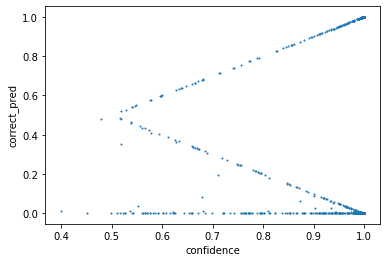

In [33]:
plt.scatter(confidence, correct_pred, s=1)
plt.xlabel('confidence')
plt.ylabel('correct_pred')

### Create UMAP object

In [34]:
from tfumap.semisupervised_model import PUMAP, compute_classifier_loss

In [35]:
def compute_umap_loss(
    batch_to,
    batch_from,
    encoder,
    embedder,
    _a,
    _b,
    negative_sample_rate=5,
    repulsion_strength=1,
):
    """
        compute the cross entropy loss for learning embeddings

        Parameters
        ----------
        batch_to : tf.int or tf.float32
            Either X or the index locations of the embeddings for verticies (to)
        batch_from : tf.int or tf.float32
            Either X or the index locations of the embeddings for verticies (from)

        Returns
        -------
        ce_loss : tf.float
            cross entropy loss for UMAP
        embedding_to : tf.float
            embeddings for verticies (to)
        embedding_from : tf.float
            embeddings for verticies (from)
        """

    # encode
    embedding_to = embedder(encoder(batch_to))
    embedding_from = embedder(encoder(batch_from))

    # get negative samples
    embedding_neg_to = tf.repeat(embedding_to, negative_sample_rate, axis=0)
    repeat_neg = tf.repeat(embedding_from, negative_sample_rate, axis=0)
    embedding_neg_from = tf.gather(
        repeat_neg, tf.random.shuffle(tf.range(tf.shape(repeat_neg)[0]))
    )

    #  distances between samples
    distance_embedding = tf.concat(
        [
            tf.norm(embedding_to - embedding_from, axis=1),
            tf.norm(embedding_neg_to - embedding_neg_from, axis=1),
        ],
        axis=0,
    )

    # convert probabilities to distances
    probabilities_distance = convert_distance_to_probability(distance_embedding, _a, _b)

    # treat positive samples as p=1, and negative samples as p=0
    probabilities_graph = tf.concat(
        [tf.ones(embedding_to.shape[0]), tf.zeros(embedding_neg_to.shape[0])], axis=0,
    )

    # cross entropy loss
    (attraction_loss, repellant_loss, ce_loss) = compute_cross_entropy(
        probabilities_graph,
        probabilities_distance,
        repulsion_strength=repulsion_strength,
    )

    return (
        attraction_loss,
        repellant_loss,
        ce_loss,
    )


In [36]:
import tensorflow as tf
from tfumap.umap import compute_cross_entropy, convert_distance_to_probability
from tfumap.semisupervised import (
    find_a_b,
    #compute_umap_loss,
    # compute_classifier_loss,
    batch_data,
)
import numpy as np
import os, tempfile
from tqdm.autonotebook import tqdm
from datetime import datetime


@tf.function
def compute_classifier_loss(X, y, encoder, classifier, sparse_ce, acc_func):
    """ compute the cross entropy loss for classification
        """
    d = classifier(encoder(X))
    loss = sparse_ce(y, d)
    acc = acc_func(y, d)
    #acc = tf.keras.metrics.sparse_categorical_accuracy(y, d)
    return loss, acc


class PUMAP(tf.keras.Model):
    def __init__(
        self,
        encoder,
        classifier,
        embedder,
        tensorboard_logdir=None,  # directory for tensorboard log
        min_dist=0.1,
        negative_sample_rate=5.0,
        optimizer=tf.keras.optimizers.SGD(0.1),
        repulsion_strength=1.0,
        # ** kwargs,
    ):
        super(PUMAP, self).__init__()
        # self.__dict__.update(kwargs)

        # subnetworks
        self.encoder = encoder
        self.classifier = classifier
        self.embedder= embedder

        # optimizer for cross entropy minimization
        self.optimizer = optimizer
        self.repulsion_strength = repulsion_strength
        self.negative_sample_rate = negative_sample_rate

        # get a,b for current min_dist
        self._a, self._b = find_a_b(min_dist)

        # create summary writer to log loss information during training
        if tensorboard_logdir is None:
            self.tensorboard_logdir = os.path.join(
                tempfile.gettempdir(),
                "tensorboard",
                datetime.now().strftime("%Y%m%d-%H%M%S"),
            )
        else:
            self.tensorboard_logdir = tensorboard_logdir
        self.summary_writer_train = tf.summary.create_file_writer(
            self.tensorboard_logdir + "/train"
        )
        self.summary_writer_valid = tf.summary.create_file_writer(
            self.tensorboard_logdir + "/valid"
        )

        # sparse categorical cross entropy
        self.sparse_ce = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
        self.class_acc = tf.keras.metrics.SparseCategoricalAccuracy()
        self.class_acc_val = tf.keras.metrics.SparseCategoricalAccuracy()

        # self.create_summary_metrics()

    #@tf.function
    def train(self, batch_to, batch_from, X, y, umap_prop = 1.0, save_loss=False):
        """ One training step 
        Input are points and weights for positive and negative 
        samples for training. 
            
        """
        if umap_prop > 0:
            with tf.GradientTape() as tape:

                (attraction_loss, repellant_loss, umap_loss) = compute_umap_loss(
                    batch_to,
                    batch_from,
                    self.encoder,
                    self.embedder,
                    self._a,
                    self._b,
                    self.negative_sample_rate,
                    self.repulsion_strength,
                )
            
                classifier_loss, classifier_acc = compute_classifier_loss(
                    X, y, self.encoder, self.classifier, self.sparse_ce, self.class_acc
                )
                loss = (
                    tf.reduce_mean(classifier_loss)
                    + tf.reduce_mean(umap_loss) * umap_prop
                )

            train_vars = (
                self.encoder.trainable_variables
                + self.classifier.trainable_variables
            )
        else:  # ignore running costly UMAP computations if not training on UMAP loss
            with tf.GradientTape() as tape:
                classifier_loss, classifier_acc = compute_classifier_loss(
                    X, y, self.encoder, self.classifier, self.sparse_ce, self.class_acc
                )
                loss = classifier_loss
            train_vars = (
                self.encoder.trainable_variables + self.classifier.trainable_variables
            )
            attraction_loss = repellant_loss = umap_loss = 0

        # compute gradient for umap
        grad = tape.gradient(loss, train_vars)

        # gradients are cliped in UMAP implementation. Any effect here?
        grad = [tf.clip_by_value(grad, -4.0, 4.0) for grad in grad]

        self.optimizer.apply_gradients(zip(grad, train_vars))

        return (
            attraction_loss,
            repellant_loss,
            tf.reduce_mean(umap_loss),
            classifier_loss,
            classifier_acc,
        )

    @tf.function
    def write_losses(
        self,
        step,
        classifier_acc,
        classifier_loss,
        umap_loss,
        classifier_loss_val,
        classifier_acc_val,
    ):
        # write train loss
        with self.summary_writer_train.as_default():
            tf.summary.scalar(
                "classif_acc", classifier_acc, step=step,
            )
            tf.summary.scalar(
                "classif_loss", classifier_loss, step=step,
            )
            tf.summary.scalar(
                "umap_loss", umap_loss, step=step,
            )
            self.summary_writer_train.flush()
        # write valid loss
        with self.summary_writer_valid.as_default():
            tf.summary.scalar(
                "classif_acc", classifier_acc_val, step=step,
            )
            tf.summary.scalar(
                "classif_loss", classifier_loss_val, step=step,
            )
            self.summary_writer_valid.flush()



In [37]:
### Initialize model
model = PUMAP(
    min_dist = 0.0,
    negative_sample_rate = 5, # how many negative samples per positive
    optimizer=tf.keras.optimizers.Adam(1e-3), # cross-entropy optimizer
    encoder=encoder,
    classifier=classifier,  
    embedder=embedder
)

### plotting results

In [38]:
from tfumap.umap import retrieve_tensors
from sklearn.decomposition import PCA
import seaborn as sns
from umap import UMAP 

def plot_umap_classif_results(
    model,
    X_valid,
    Y_valid,
    X_train,
    X_labeled,
    Y_labeled,
    batch_size,
    dralg = PCA, #umap
    cmap="coolwarm",
    cmap2="bwr",
):
    # get loss dataframe from tensorboard
    try:
        loss_df = retrieve_tensors(model.tensorboard_logdir)
        losses_exist = True
    except ValueError as e:
        print(e)
        losses_exist = False

    pred_model = tf.keras.models.Model(model.classifier.input,[model.classifier.get_layer(name="dense_1").get_output_at(0)])

    # embed data
    enc_valid = model_data(X_valid, batch_size, model.encoder)
    class_valid = model_data(enc_valid, batch_size, pred_model)
    pred_valid = model_data(enc_valid, batch_size, model.classifier)

    enc_lab = model_data(X_labeled, batch_size, model.encoder)
    class_lab = model_data(enc_lab, batch_size, pred_model)
    pred_lab = model_data(enc_lab, batch_size, model.classifier)

    # get classifications and correctness
    classifications_valid = np.argmax(pred_valid, axis=1)
    correctness_valid = classifications_valid == Y_valid

    classifications_lab = np.argmax(pred_lab, axis=1)
    correctness_lab = classifications_lab == np.array(Y_labeled)

    confidence_lab  = np.max(pred_lab, axis=1)
    confidence_valid = np.max(pred_valid, axis=1)

    thresh = 0.0 #0.8
    mask_valid = confidence_valid > thresh
    mask_lab = confidence_lab > thresh

    # embed into 2D 
    dr = dralg()
    enc_valid_2 = dr.fit_transform(enc_valid[mask_valid])
    enc_lab_2 = dr.transform(enc_lab[mask_lab])



    dr = dralg()
    class_valid_2 = dr.fit_transform(class_valid[mask_valid])
    class_lab_2 = dr.transform(class_lab[mask_lab])
    
    fig, axs = plt.subplots(ncols=4, nrows=3, figsize=(14, 10), gridspec_kw = {'wspace':0, 'hspace':0})
    for row, (z_val, z_lab, z_title) in enumerate([
        [enc_valid_2, enc_lab_2, 'encoder'], 
        [class_valid_2, class_lab_2, 'last_layer_classifier'], 

    ]):
        for col, (y_valid, y_labeled, label_name) in enumerate([
            [Y_valid, Y_labeled, 'ground_truth'],
            [classifications_valid, classifications_lab, 'predictions'],
            [correctness_valid, correctness_lab, 'correctness'],
            [confidence_valid, confidence_lab, 'confidence'],
        ]):
            ax = axs[row, col]
            #ax.axis('off')
            if col == 0:
                ax.set_ylabel(z_title)
            if row == 0:
                ax.set_title(label_name)
            #ax.set_title(z_title + '_' + label_name)
            ax.scatter(
                z_val[:, 0],
                z_val[:, 1],
                c=y_valid[mask_valid],
                cmap=cmap if label_name not in ["correctness", "confidence"]  else 'viridis',  # "tab10"
                s=2,
                alpha=0.25,
                rasterized=True,
            )
            if False:
                ax.scatter(
                    z_lab[:, 0],
                    z_lab[:, 1],
                    c=y_labeled[mask_lab],
                    cmap=cmap if label_name not in ["correctness", "confidence"] else 'viridis',  # "tab10"
                    s=20,
                    alpha=0.25,
                    rasterized=True,
                )
            ax.set_xticks([])
            ax.set_yticks([])
        
    plt.show()
    
    fig, axs = plt.subplots(ncols=3, figsize=(13.4,3))
    if losses_exist:
        ax = axs[0]
        sns.lineplot(
            x="step",
            y="val",
            hue="group",
            data=loss_df[loss_df.variable == "umap_loss"],
            ci=None,
            legend=None,
            ax=ax,
        )
        ax.legend(loc="upper right")
        ax.set_xscale("log")
        ax.set_title("UMAP loss", fontsize=24)
        ax.set_ylabel("Cross Entropy")
        
        ax = axs[1]
        sns.lineplot(
            x="step",
            y="val",
            hue="group",
            data=loss_df[loss_df.variable == "classif_loss"],
            ci=None,
            legend=None,
            ax=ax,
        )
        ax.set_xscale("log")
        ax.legend(loc="upper right")
        # ax.set_yscale("log")
        ax.set_title("Classif loss", fontsize=24)
        ax.set_ylabel("Cross Entropy")
        
        ax = axs[2]
        sns.lineplot(
            x="step",
            y="val",
            hue="group",
            data=loss_df[loss_df.variable == "classif_acc"],
            ci=None,
            legend=None,
            ax=ax,
        )
        ax.set_xscale("log")
        ax.legend(loc="lower right")
        ax.set_title("Classif acc", fontsize=24)
        ax.set_ylabel("Acc")
    plt.show()

No objects to concatenate


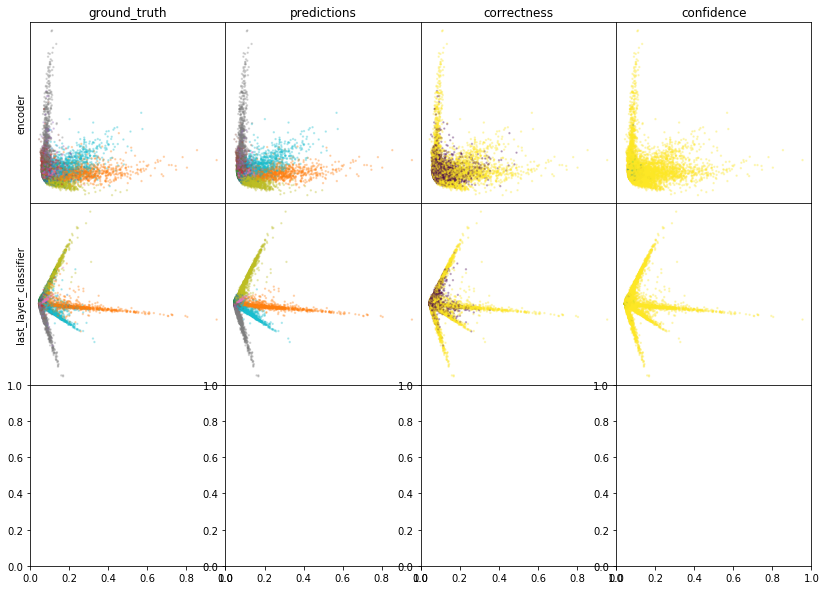

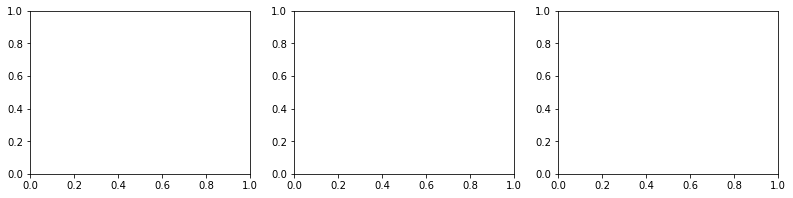

In [39]:
plot_umap_classif_results(model, X_valid, Y_valid, X_train, X_labeled, Y_labeled, batch_size, dralg=PCA, cmap='tab10', cmap2='tab10')

In [40]:
def create_edge_iterator(
    head, tail, weight, batch_size, max_sample_repeats_per_epoch=25
):
    """ create an iterator for edges
    """
    # set the maximum number of times each edge should be repeated per epoch
    epochs_per_sample = np.clip(
        (weight / np.max(weight)) * max_sample_repeats_per_epoch,
        1,
        max_sample_repeats_per_epoch,
    ).astype("int")

    edges_to_exp, edges_from_exp = (
        np.repeat(head, epochs_per_sample.astype("int")),
        np.repeat(tail, epochs_per_sample.astype("int")),
    )

    # permutate
    perm_mask = np.random.permutation(range(len(edges_to_exp)))
    edges_to_exp = edges_to_exp[perm_mask]
    edges_from_exp = edges_from_exp[perm_mask]

    def augmentation_generator():  # edges_to, edges_from, batch_size
        """
        https://github.com/keras-team/keras/issues/5834
        """
        
        img_data_gen = tf.keras.preprocessing.image.ImageDataGenerator(
            rotation_range=10,       # random rotation degrees
            width_shift_range=0.1,   # random shift 10%
            height_shift_range=0.1,
            horizontal_flip=True,
            brightness_range = (0.5, 1.5),
            ##rescale = 0.1,
            zoom_range = 0.2,
            rescale=1./255,  
            #shear_range = 6,
            ##zca_whitening = True,
        )
        
        n_batches = int(len(edges_from_exp) / batch_size)
        to_batches = np.reshape(
            edges_to_exp[: n_batches * batch_size], (n_batches, batch_size)
        )
        from_batches = np.reshape(
            edges_from_exp[: n_batches * batch_size], (n_batches, batch_size)
        )
        for batch_to, batch_from in zip(to_batches, from_batches):
            # yield X_train[batch_to], X_train[batch_from]
            yield (
                next(
                    img_data_gen.flow(
                        X_train[batch_to], batch_size=batch_size, shuffle=False
                    )
                ),
                next(
                    img_data_gen.flow(
                        X_train[batch_from], batch_size=batch_size, shuffle=False
                    )
                ),
            )

    nthreads = 10
    edge_iter = tf.data.Dataset.from_tensor_slices(
        ["Gen_" + str(i) for i in range(nthreads)]
    )
    edge_iter = ds.interleave(
        lambda x: tf.data.Dataset.from_generator(
            augmentation_generator, (tf.float32, tf.float32)
        ),
        cycle_length=nthreads,
        block_length=1,
        num_parallel_calls=nthreads,
    )

    return edge_iter, len(edges_to_exp)

In [41]:
def create_edge_iterator(
    head, tail, weight, batch_size, max_sample_repeats_per_epoch=25
):
    """ create an iterator for edges
    """
    # set the maximum number of times each edge should be repeated per epoch
    epochs_per_sample = np.clip(
        (weight / np.max(weight)) * max_sample_repeats_per_epoch,
        1,
        max_sample_repeats_per_epoch,
    ).astype("int")

    edges_to_exp, edges_from_exp = (
        np.repeat(head, epochs_per_sample.astype("int")),
        np.repeat(tail, epochs_per_sample.astype("int")),
    )

    # permutate
    perm_mask = np.random.permutation(range(len(edges_to_exp)))
    edges_to_exp = edges_to_exp[perm_mask]
    edges_from_exp = edges_from_exp[perm_mask]

        
    edge_iter = (
        tf.data.Dataset.from_tensor_slices((edges_to_exp, edges_from_exp))
    ).batch(batch_size).prefetch(5)
    
    return edge_iter, len(edges_to_exp)

In [42]:
pred_model = tf.keras.models.Model(
        model.classifier.input,
        [model.classifier.get_layer(name="dense_1").get_output_at(0)],
    )

In [43]:
N_EPOCHS = 50
n_neighbors=15
batch_size = 256 # 500
max_sample_repeats_per_epoch = 25
max_save_delta = 0.005

In [44]:
from tfumap.semisupervised import build_fuzzy_simplicial_set

In [45]:
from tfumap.paths import MODEL_DIR

In [46]:
# where to save checkpoints
cpt_path = MODEL_DIR / 'semisupervised' / dataset / datestring

In [47]:
patience = 10000 # wait this many batches without improvement before early stopping
min_delta = 0.0001 # threshold for what counts as an improvement
best_acc = 0 # the best current accuracy score
best_saved_acc = 0 # best accuracy on valid data that has been checkpointed
best_saved_batch = 0 # batch number for last good batch
max_reinitialize_delta = .01 # minimum loss in accuracy resulting in reinitialized weights
plot_frequency = 1000 # how frequently to plot
max_reloads = 10 # how often can we reload weights?
batch = 0; epoch = 0
batches_since_last_reload = 0

In [48]:
epochs_without_improvement = 0
max_epochs_without_improvement = 5 # allow the network 
reload_tolerance = 100 # allow the network at least reload_tolerance batches before reloading last weights

In [49]:
repeat_augment_tolerance = 25 # augmentations are allowed to be repeated up until this many times 
# we could also have a bank of sampleable augmentations per exemplar

In [50]:
BATCHES_PER_EPOCH = int(n_edges_per_epoch / batch_size)

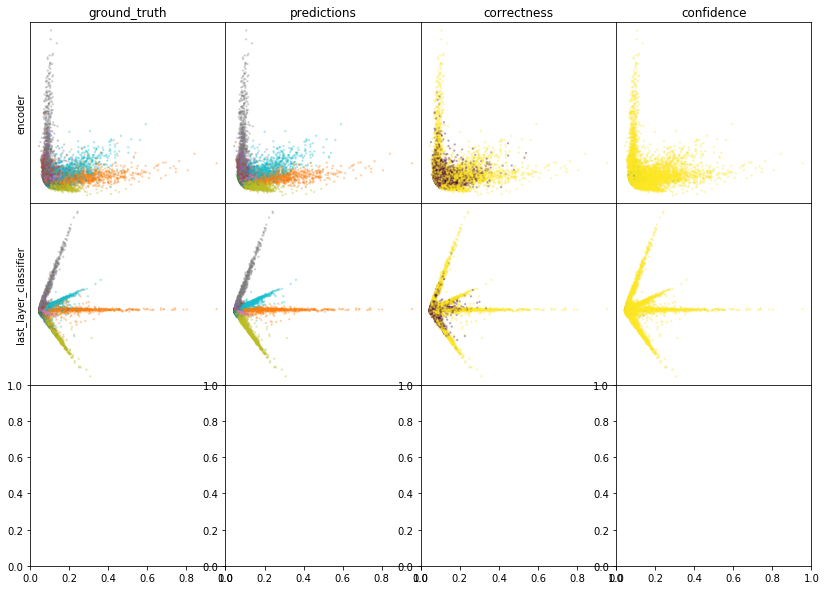

W0809 10:16:14.569409 139799398029120 legend.py:1282] No handles with labels found to put in legend.
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:118: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:132: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
W0809 10:16:14.603098 139799398029120 legend.py:1282] No handles with labels found to put in legend.
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:148: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
W0809 10:16:14.641650 139799398029120 legend.py:1282] No handles with labels found to put in legend.


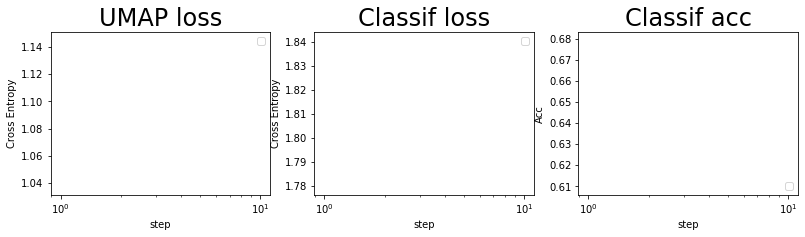

batch: 0 | train acc: 0.6797 | val acc: 0.6094
saving weights | batch = 100 | acc = 55.469
saving weights | batch = 131 | acc = 55.984
saving weights | batch = 148 | acc = 56.502
saving weights | batch = 174 | acc = 57.009
saving weights | batch = 202 | acc = 57.535
saving weights | batch = 227 | acc = 58.042
saving weights | batch = 256 | acc = 58.56
saving weights | batch = 299 | acc = 59.076
saving weights | batch = 358 | acc = 59.593
saving weights | batch = 425 | acc = 60.098
saving weights | batch = 516 | acc = 60.619
saving weights | batch = 647 | acc = 61.126
saving weights | batch = 846 | acc = 61.628


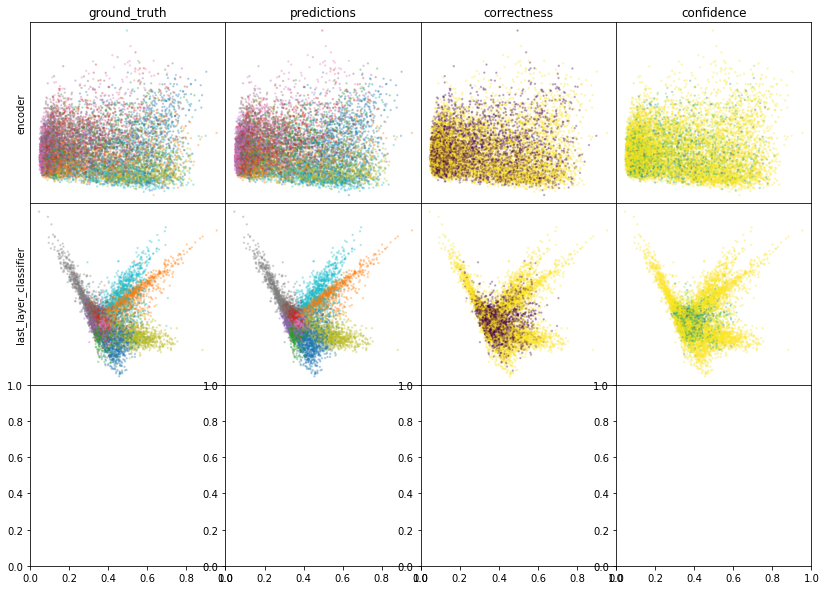

W0809 10:17:59.062343 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:17:59.099140 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:17:59.133898 139799398029120 legend.py:1282] No handles with labels found to put in legend.


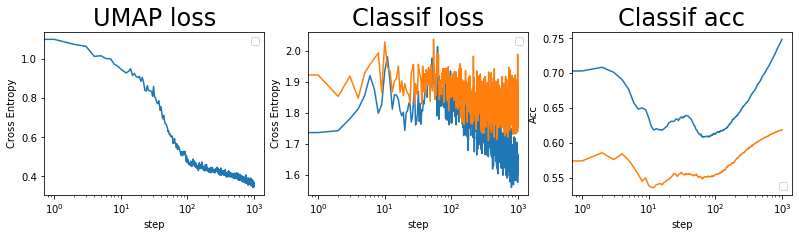

batch: 1000 | train acc: 0.7484 | val acc: 0.6184
saving weights | batch = 1352 | acc = 62.131


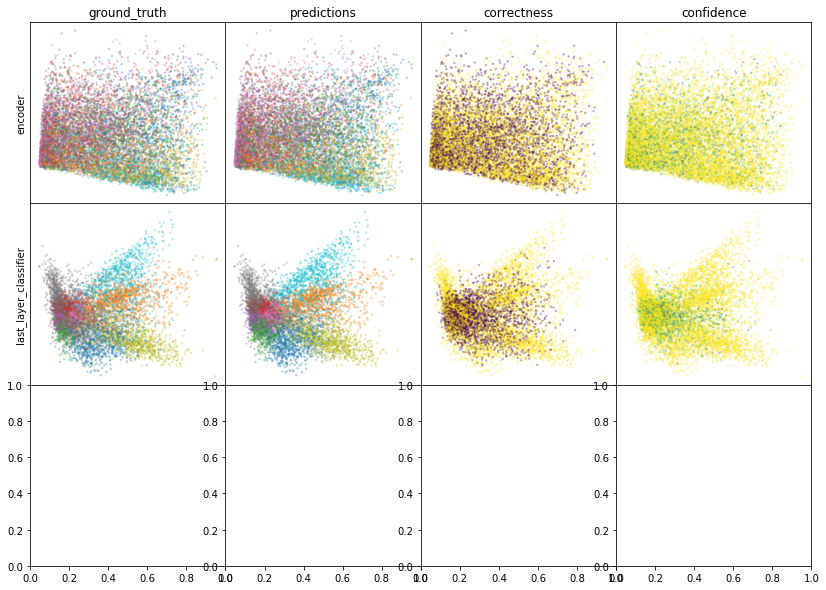

W0809 10:19:55.335693 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:19:55.373742 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:19:55.409548 139799398029120 legend.py:1282] No handles with labels found to put in legend.


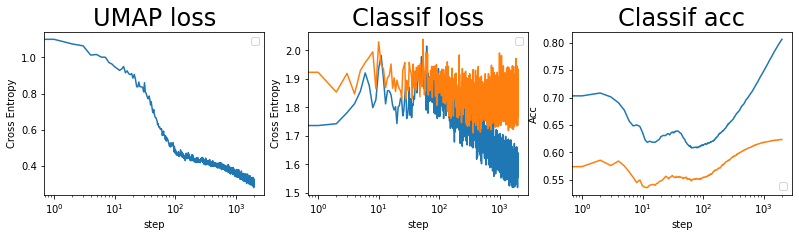

batch: 2000 | train acc: 0.8061 | val acc: 0.6236


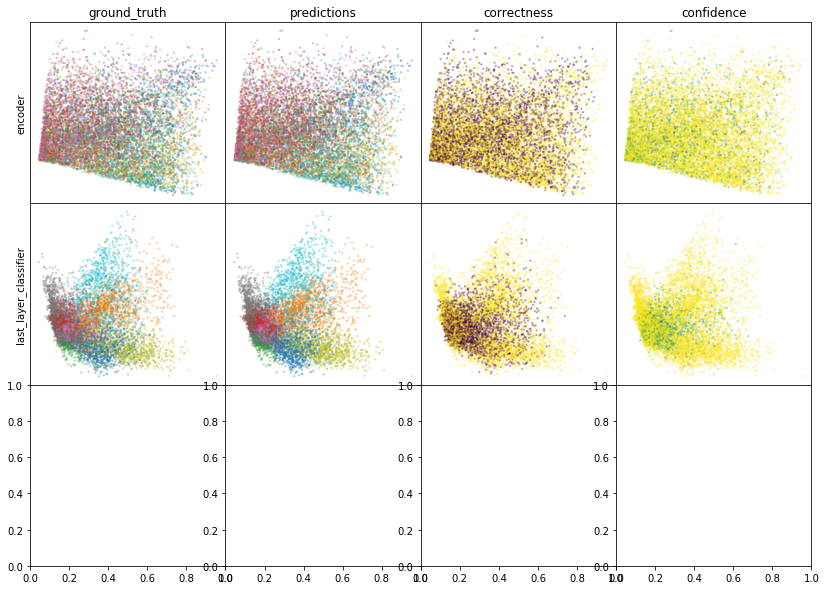

W0809 10:21:40.735785 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:21:40.776437 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:21:40.820224 139799398029120 legend.py:1282] No handles with labels found to put in legend.


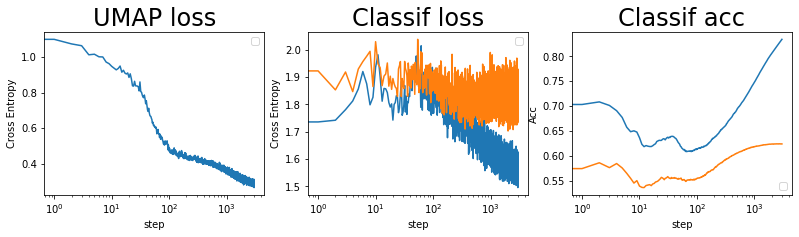

batch: 3000 | train acc: 0.8341 | val acc: 0.6238


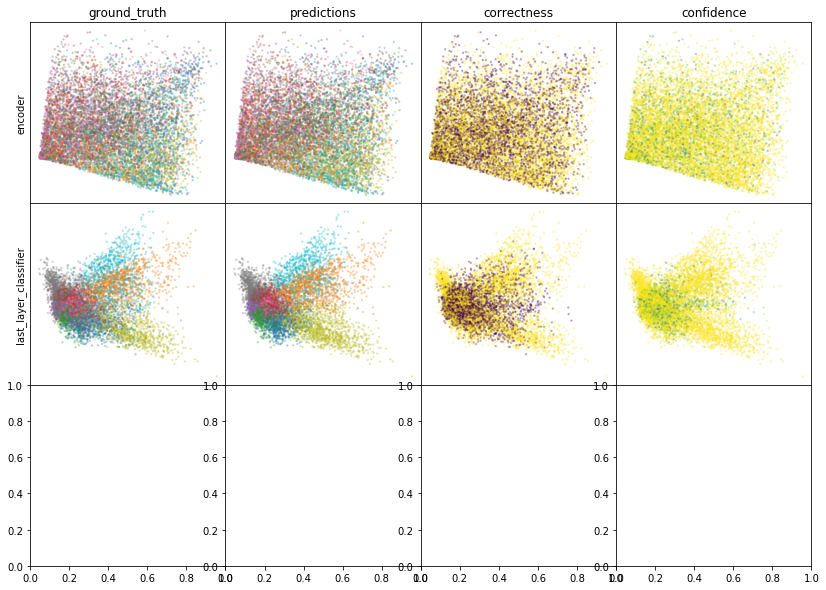

W0809 10:23:37.944523 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:23:37.994776 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:23:38.036184 139799398029120 legend.py:1282] No handles with labels found to put in legend.


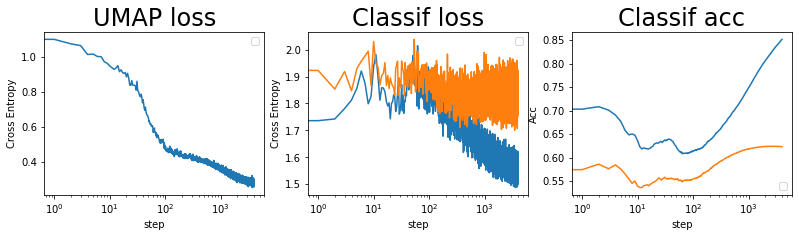

batch: 4000 | train acc: 0.8518 | val acc: 0.623


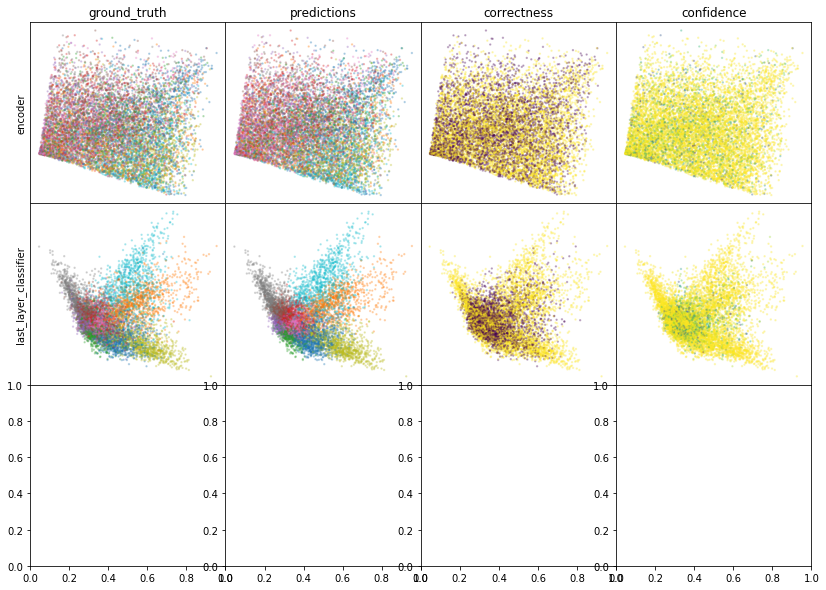

W0809 10:25:23.451289 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:25:23.494424 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:25:23.538370 139799398029120 legend.py:1282] No handles with labels found to put in legend.


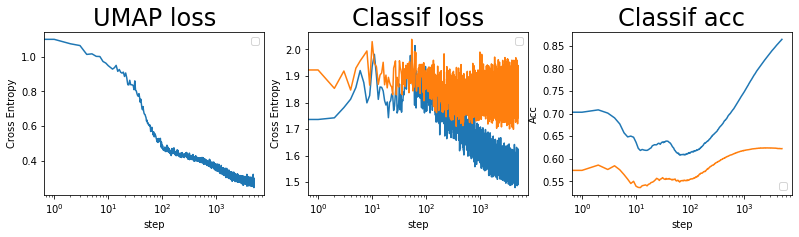

batch: 5000 | train acc: 0.8647 | val acc: 0.6224


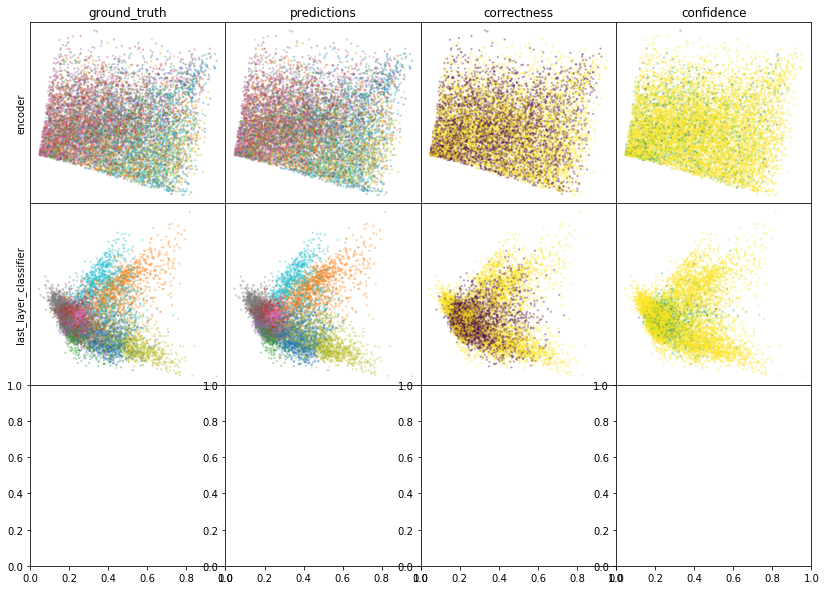

W0809 10:27:15.571822 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:27:15.618309 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:27:15.676276 139799398029120 legend.py:1282] No handles with labels found to put in legend.


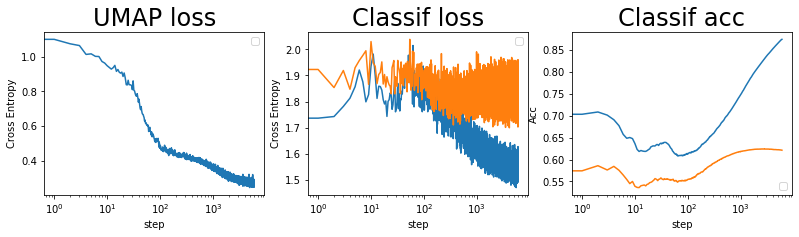

batch: 6000 | train acc: 0.8739 | val acc: 0.6212


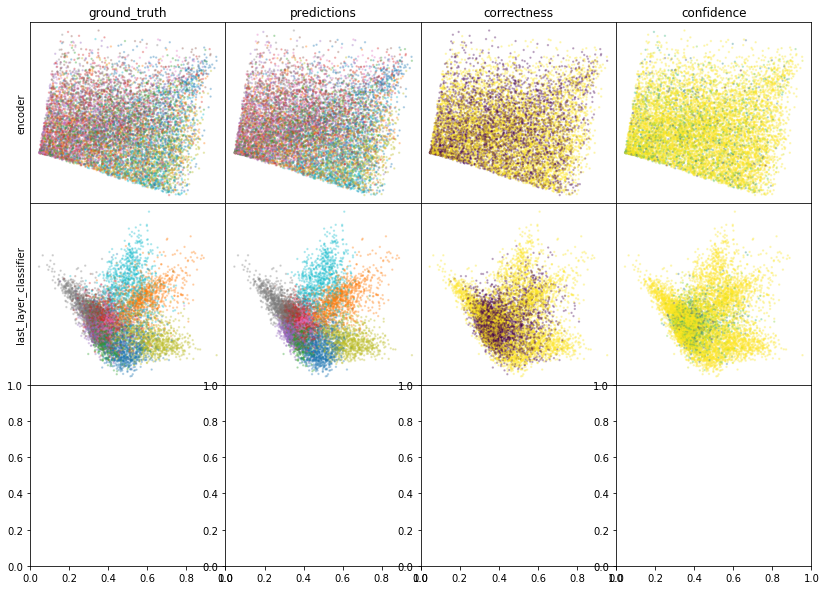

W0809 10:29:04.226254 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:29:04.273163 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:29:04.319011 139799398029120 legend.py:1282] No handles with labels found to put in legend.


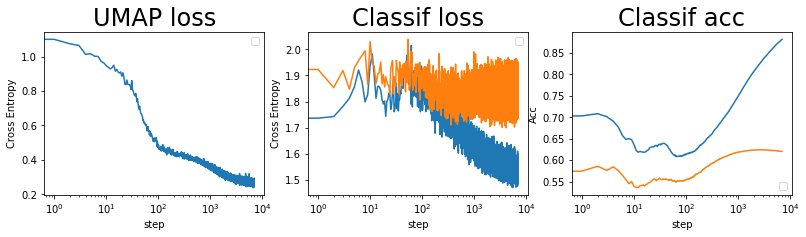

batch: 7000 | train acc: 0.8816 | val acc: 0.6203


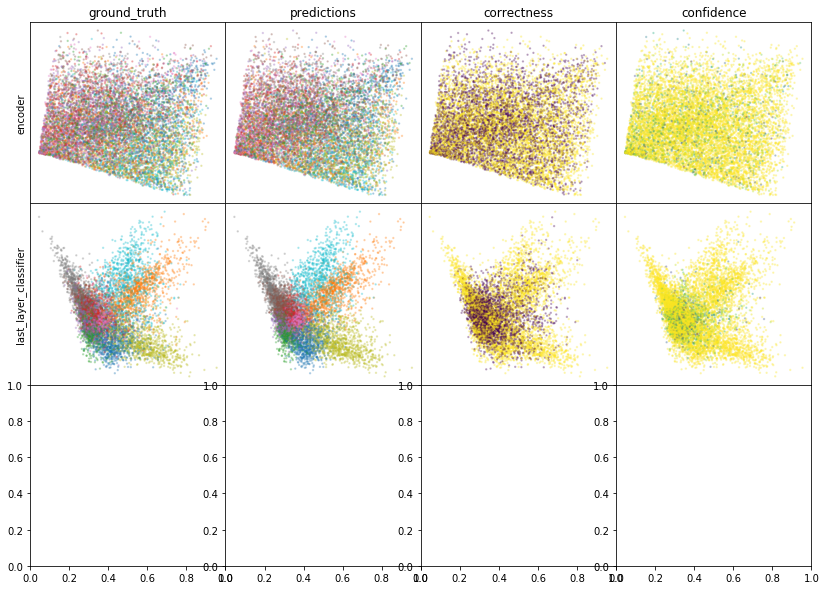

W0809 10:30:52.945692 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:30:52.995362 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:30:53.044363 139799398029120 legend.py:1282] No handles with labels found to put in legend.


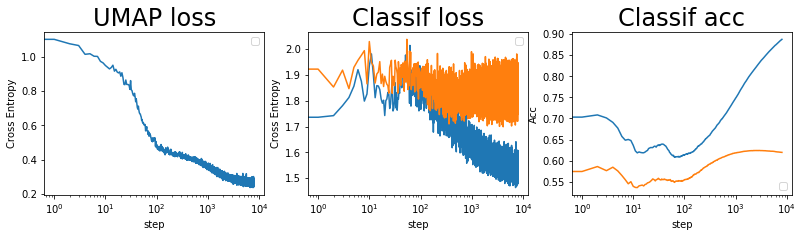

batch: 8000 | train acc: 0.8875 | val acc: 0.6195


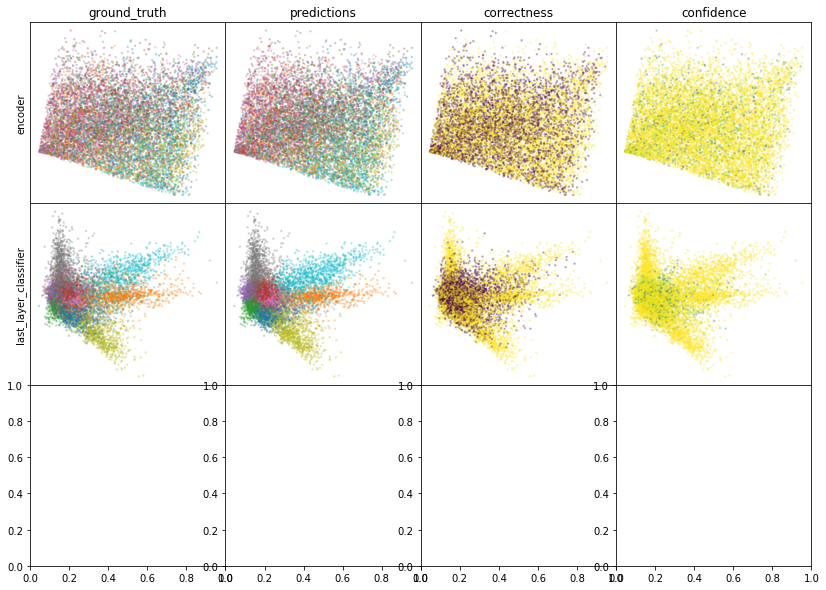

W0809 10:32:44.589854 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:32:44.640418 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:32:44.695560 139799398029120 legend.py:1282] No handles with labels found to put in legend.


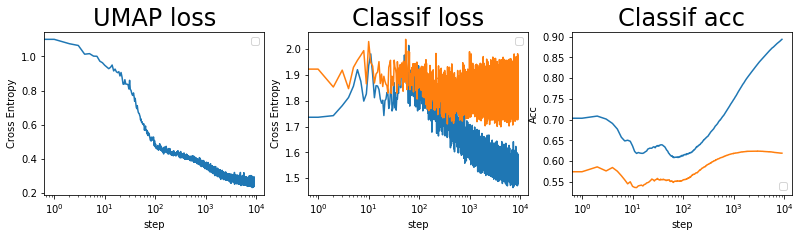

batch: 9000 | train acc: 0.8932 | val acc: 0.6189


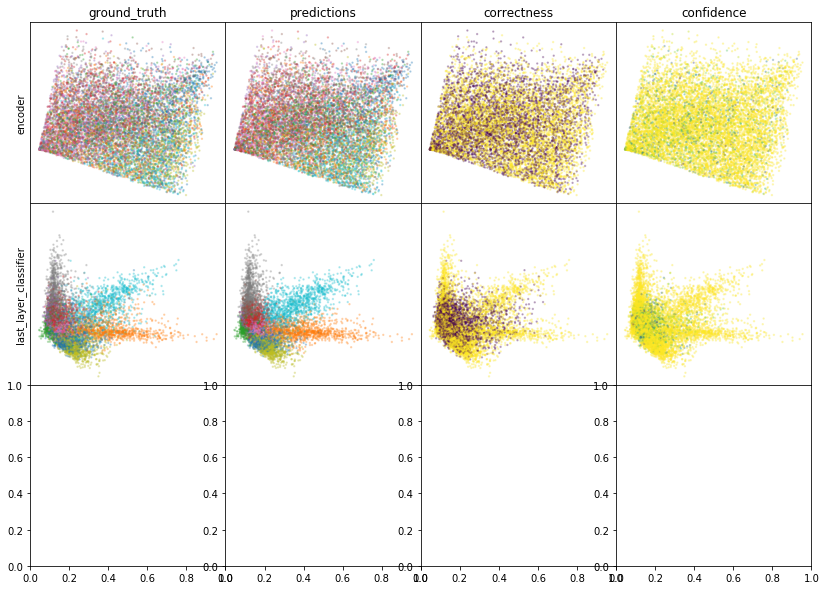

W0809 10:34:31.546790 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:34:31.600348 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:34:31.653836 139799398029120 legend.py:1282] No handles with labels found to put in legend.


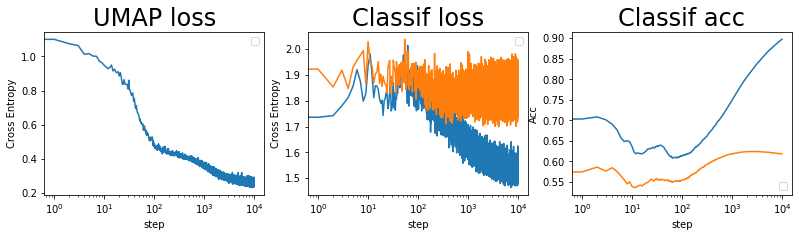

batch: 10000 | train acc: 0.8973 | val acc: 0.6182


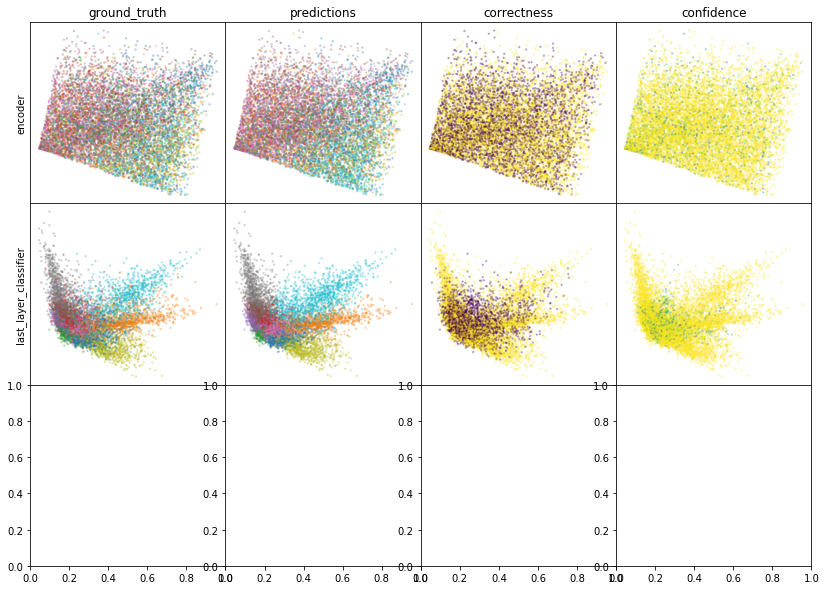

W0809 10:36:27.777207 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:36:27.832257 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:36:27.883362 139799398029120 legend.py:1282] No handles with labels found to put in legend.


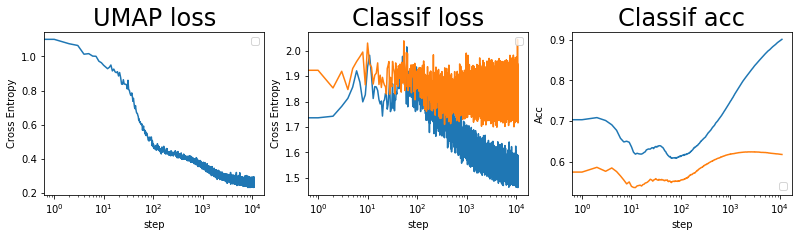

batch: 11000 | train acc: 0.901 | val acc: 0.6176


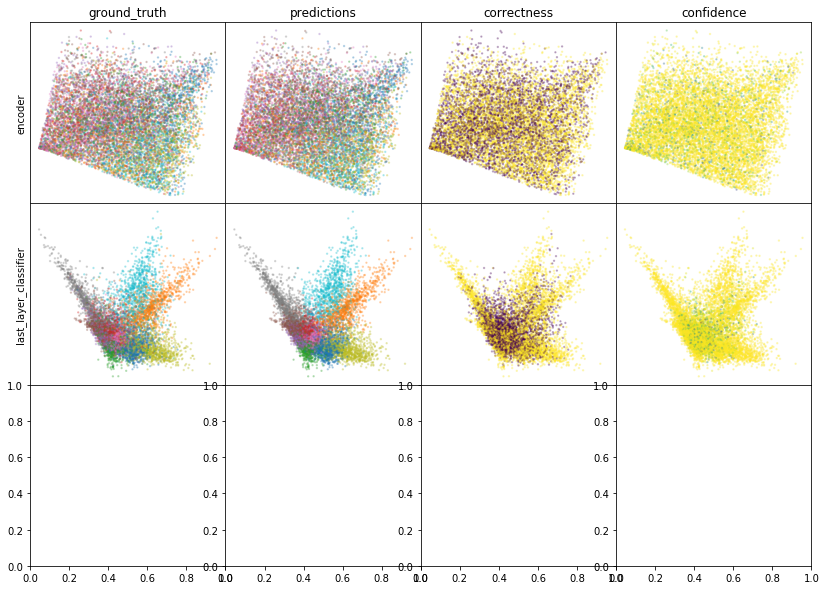

W0809 10:38:13.374341 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:38:13.431852 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:38:13.489550 139799398029120 legend.py:1282] No handles with labels found to put in legend.


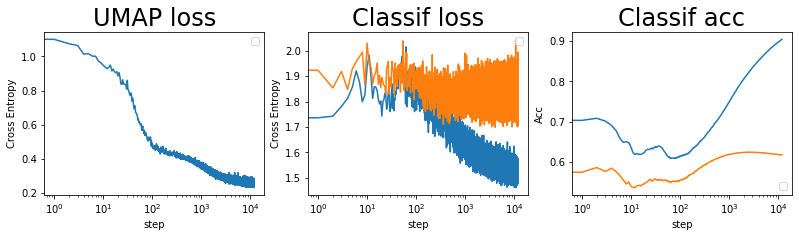

batch: 12000 | train acc: 0.9045 | val acc: 0.6176
leaving epoch because no improvement in 10000 batches


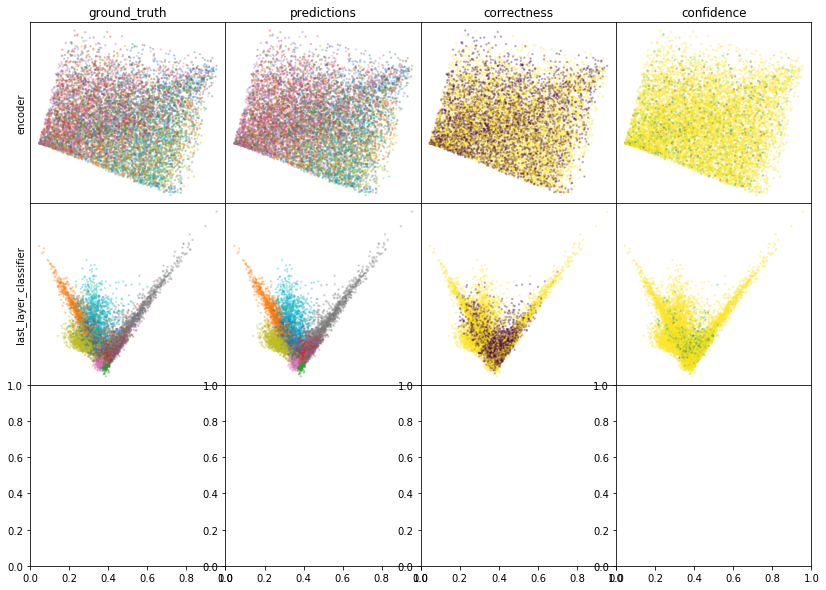

W0809 10:40:10.674673 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:40:10.735035 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:40:10.790921 139799398029120 legend.py:1282] No handles with labels found to put in legend.


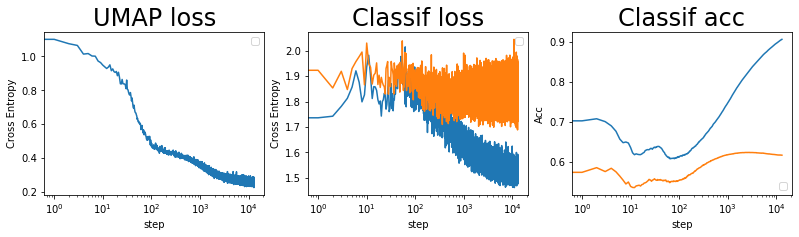

batch: 13000 | train acc: 0.9072 | val acc: 0.6172


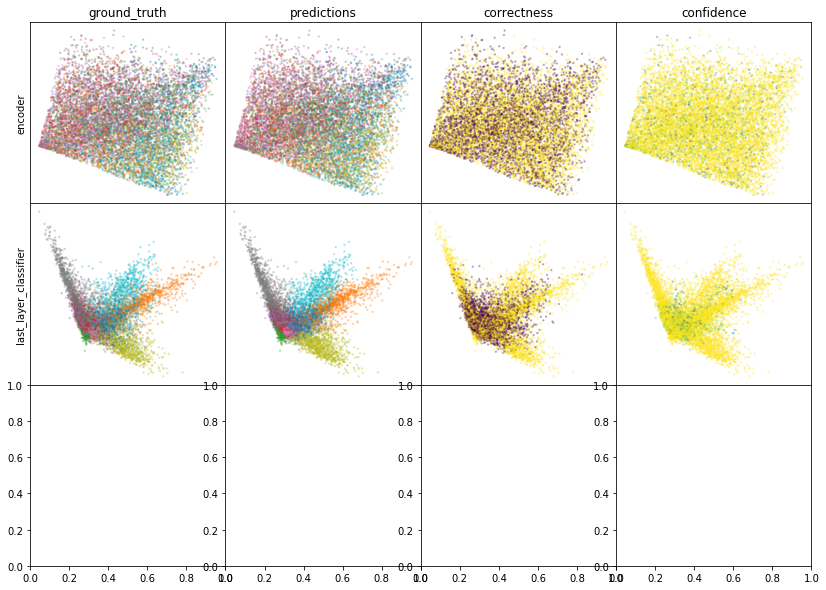

W0809 10:41:54.828737 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:41:54.895496 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:41:54.962334 139799398029120 legend.py:1282] No handles with labels found to put in legend.


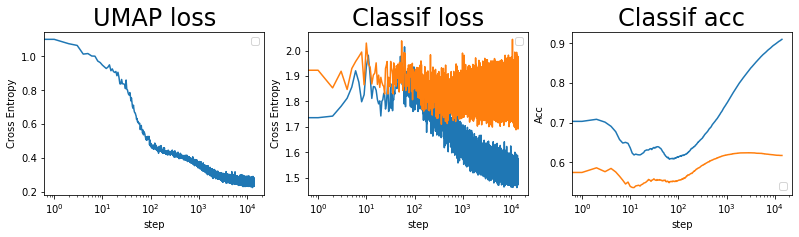

batch: 14000 | train acc: 0.9101 | val acc: 0.6171


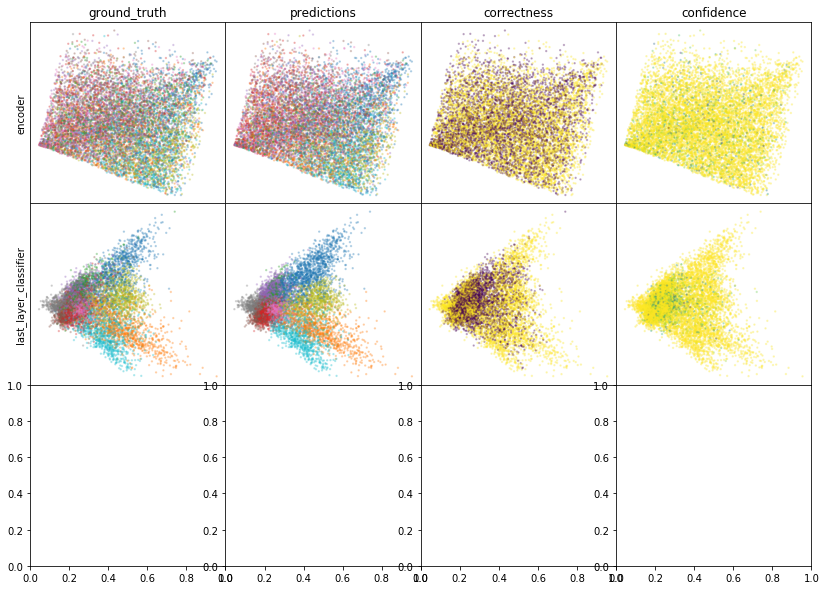

W0809 10:43:52.177726 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:43:52.244832 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:43:52.308780 139799398029120 legend.py:1282] No handles with labels found to put in legend.


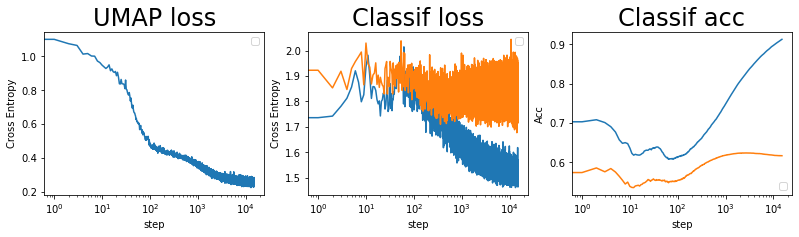

batch: 15000 | train acc: 0.9125 | val acc: 0.617


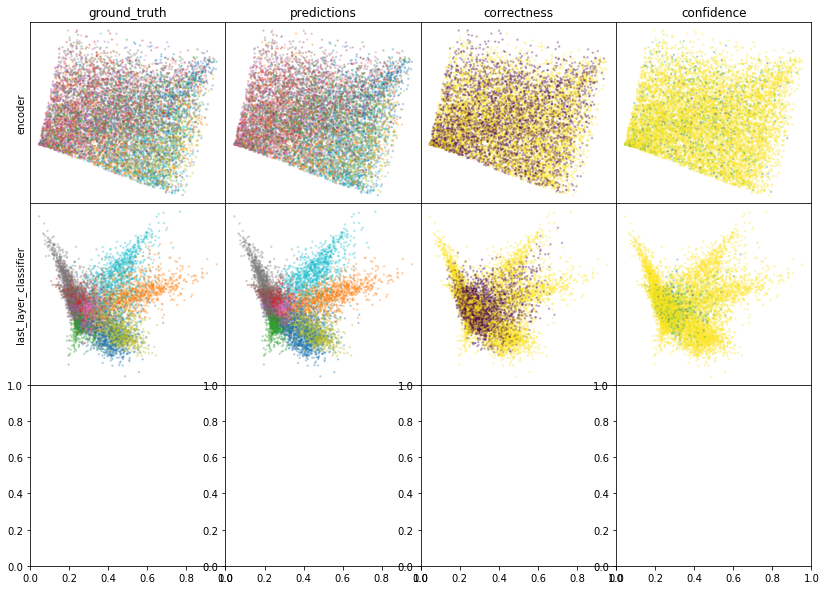

W0809 10:45:37.624501 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:45:37.693764 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:45:37.758430 139799398029120 legend.py:1282] No handles with labels found to put in legend.


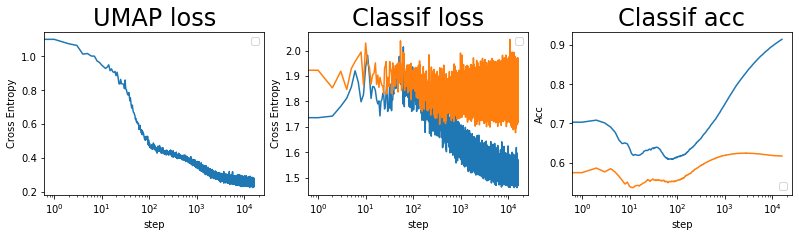

batch: 16000 | train acc: 0.9148 | val acc: 0.6168


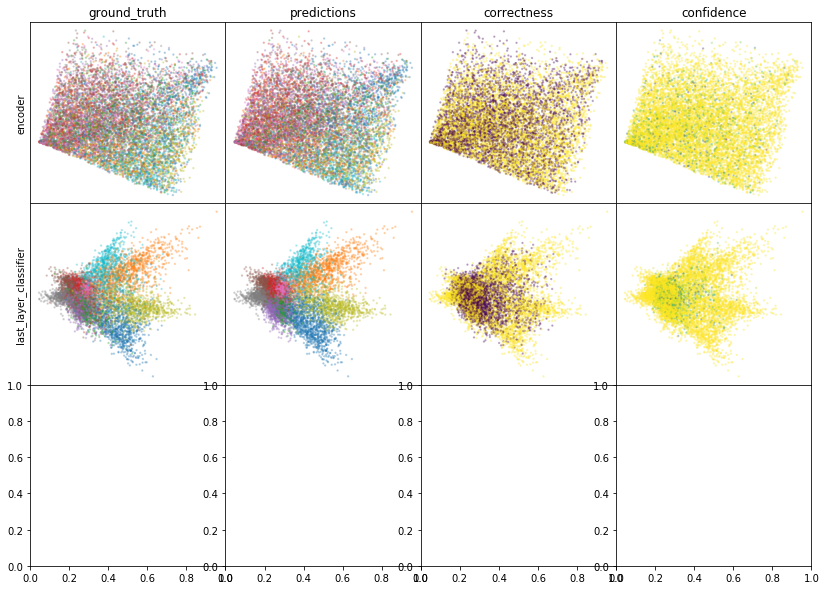

W0809 10:47:35.822742 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:47:35.893027 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:47:35.955728 139799398029120 legend.py:1282] No handles with labels found to put in legend.


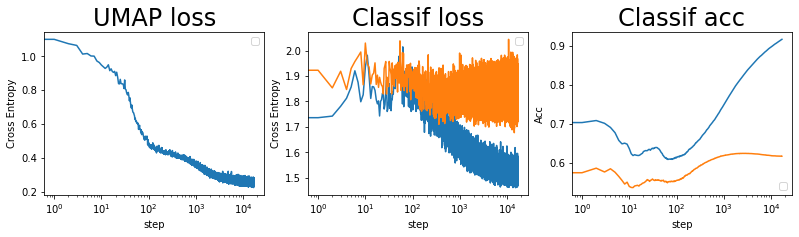

batch: 17000 | train acc: 0.917 | val acc: 0.6165


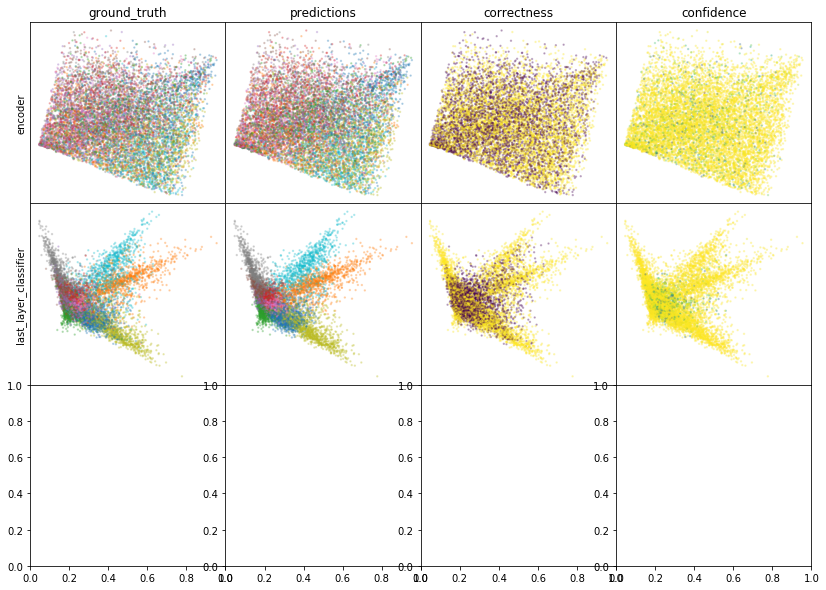

W0809 10:49:21.310110 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:49:21.377895 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:49:21.441327 139799398029120 legend.py:1282] No handles with labels found to put in legend.


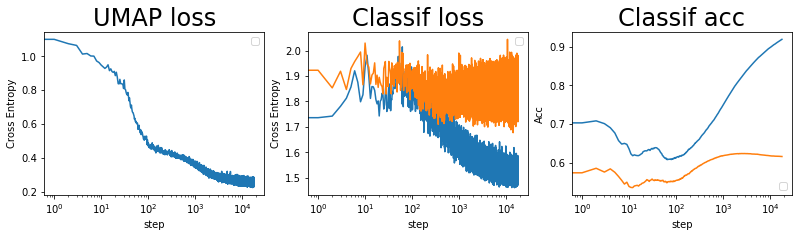

batch: 18000 | train acc: 0.9188 | val acc: 0.6163


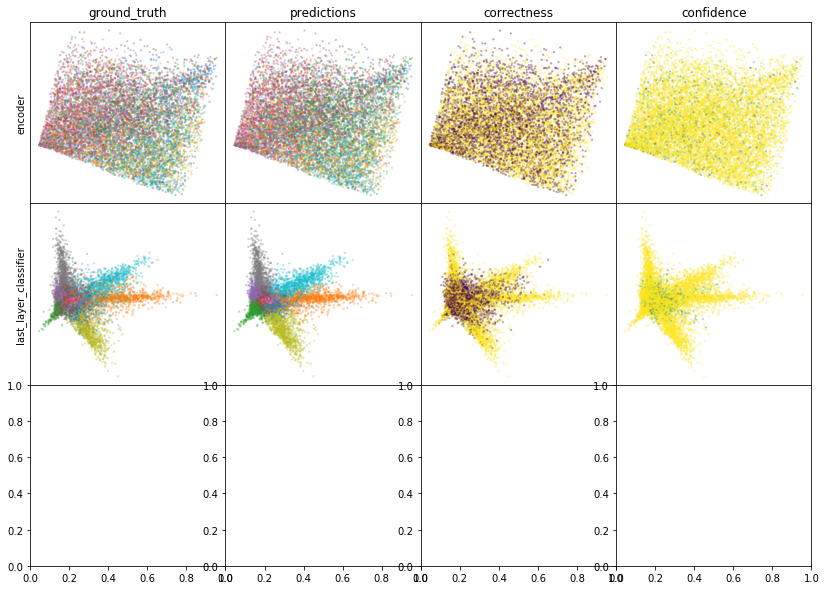

W0809 10:51:17.623031 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:51:17.692729 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:51:17.784173 139799398029120 legend.py:1282] No handles with labels found to put in legend.


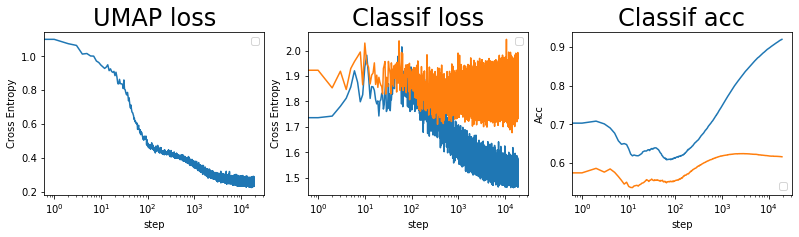

batch: 19000 | train acc: 0.9204 | val acc: 0.616


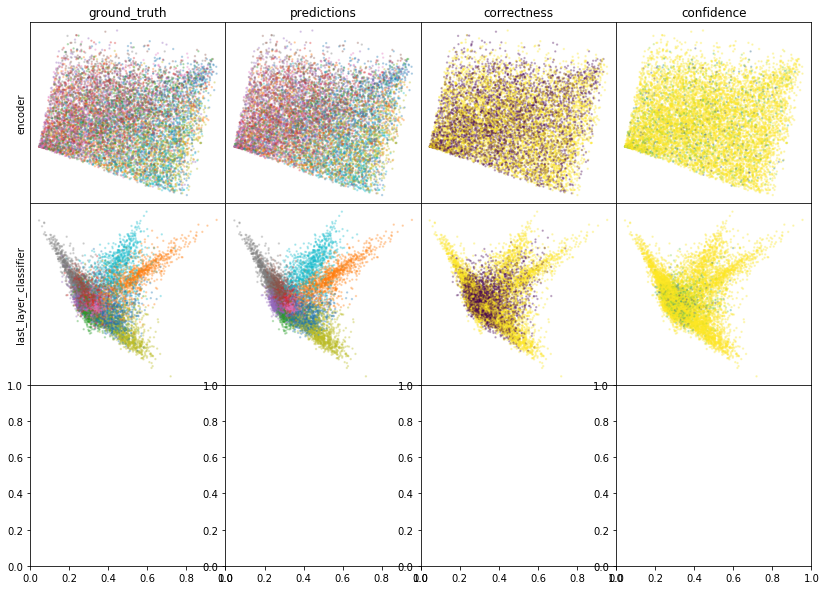

W0809 10:53:07.136883 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:53:07.211285 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:53:07.285520 139799398029120 legend.py:1282] No handles with labels found to put in legend.


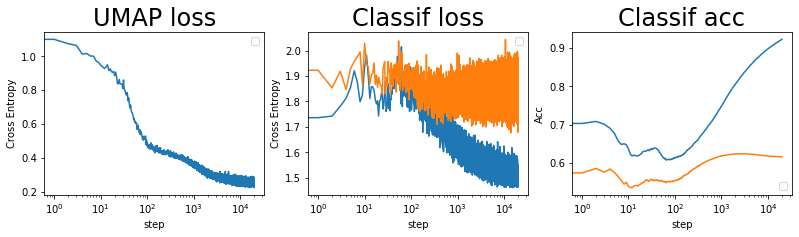

batch: 20000 | train acc: 0.9222 | val acc: 0.6159


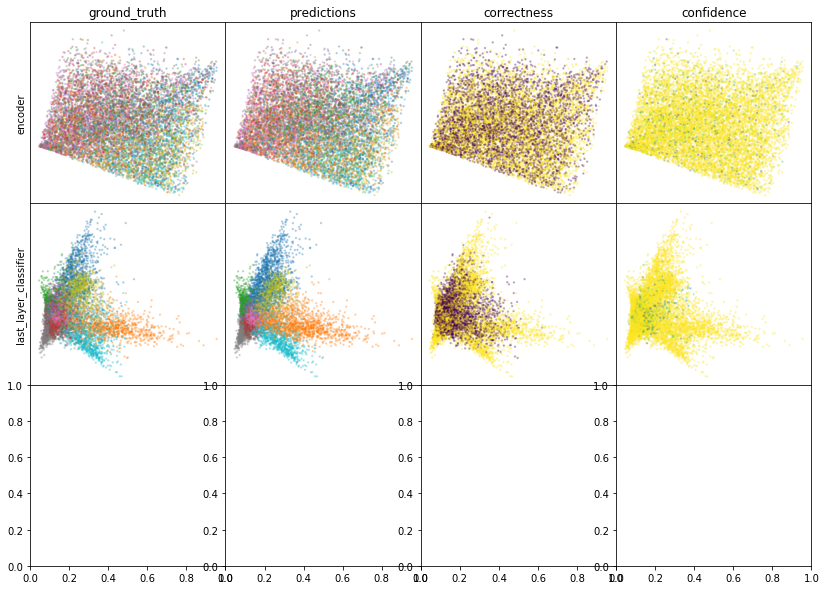

W0809 10:55:03.282831 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:55:03.358527 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:55:03.435107 139799398029120 legend.py:1282] No handles with labels found to put in legend.


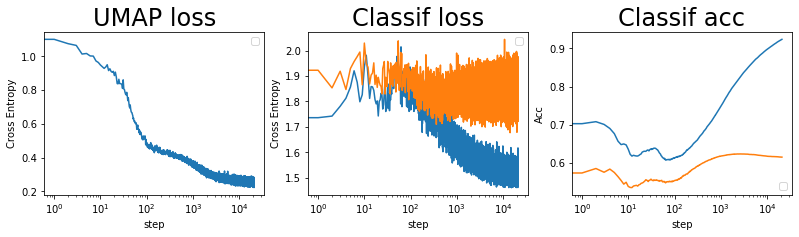

batch: 21000 | train acc: 0.9236 | val acc: 0.6157


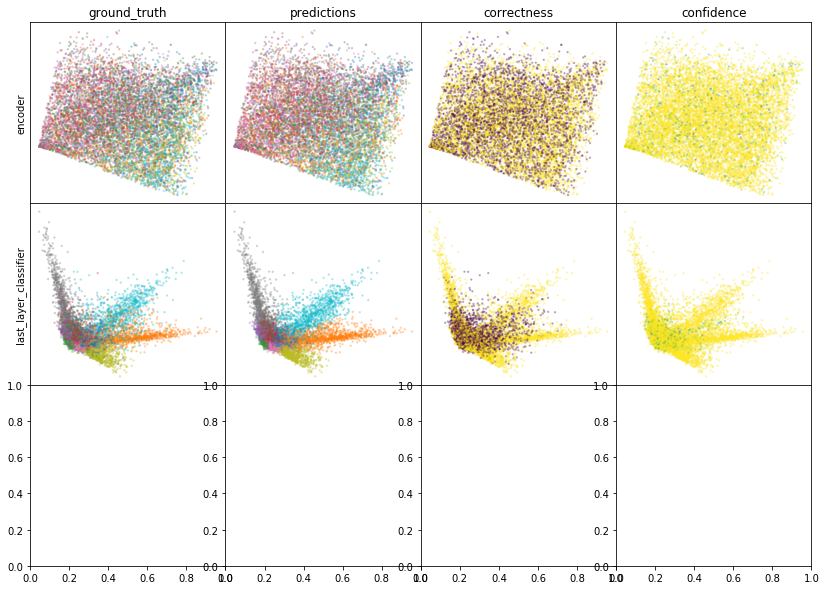

W0809 10:56:54.855998 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:56:54.937713 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:56:55.008522 139799398029120 legend.py:1282] No handles with labels found to put in legend.


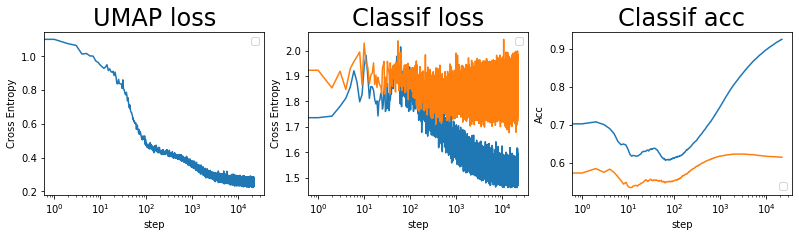

batch: 22000 | train acc: 0.9247 | val acc: 0.6156
leaving epoch because no improvement in 10000 batches


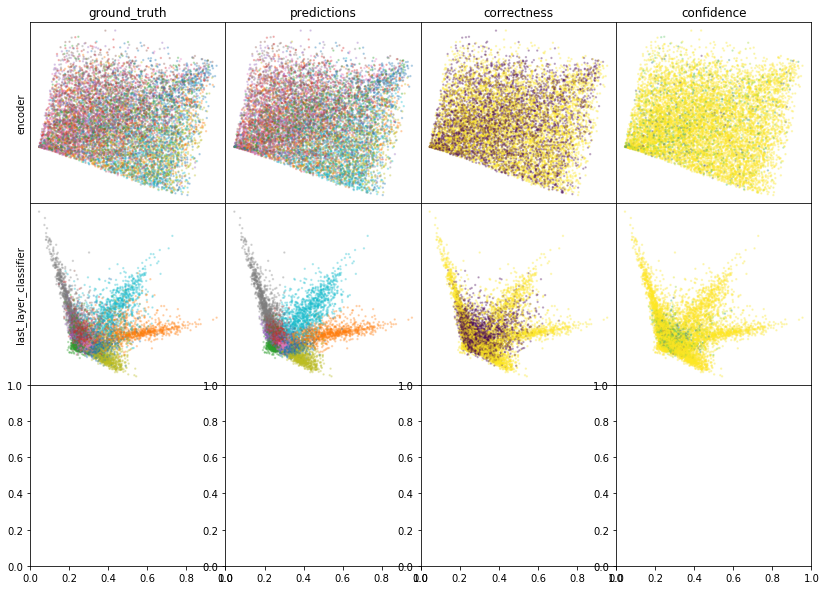

W0809 10:58:47.855507 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:58:47.935599 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 10:58:48.008860 139799398029120 legend.py:1282] No handles with labels found to put in legend.


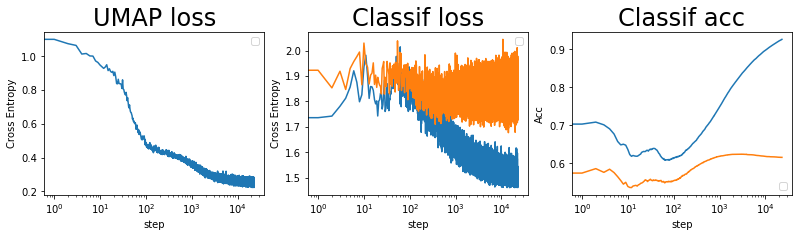

batch: 23000 | train acc: 0.9261 | val acc: 0.6156


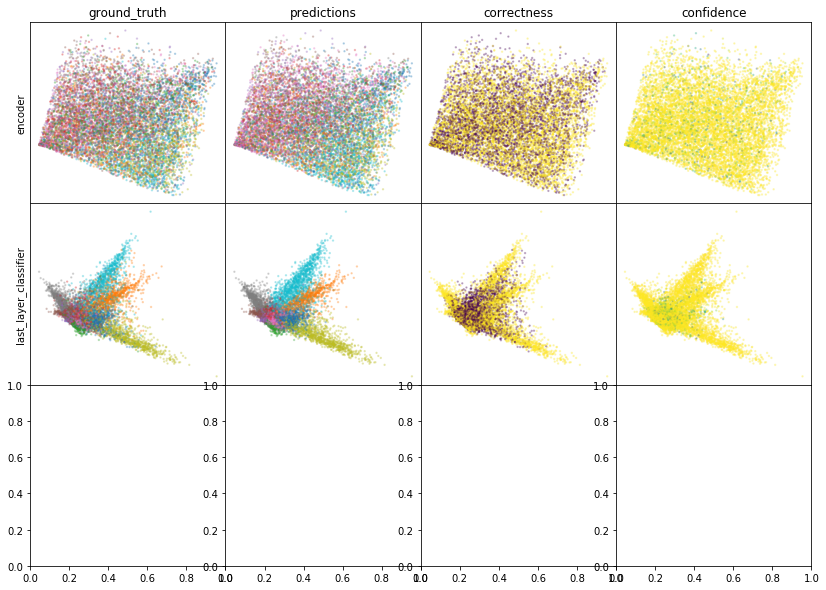

W0809 11:00:42.619986 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 11:00:42.710407 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 11:00:42.786220 139799398029120 legend.py:1282] No handles with labels found to put in legend.


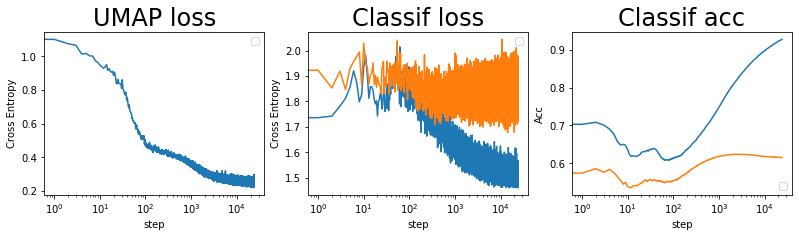

batch: 24000 | train acc: 0.9274 | val acc: 0.6155


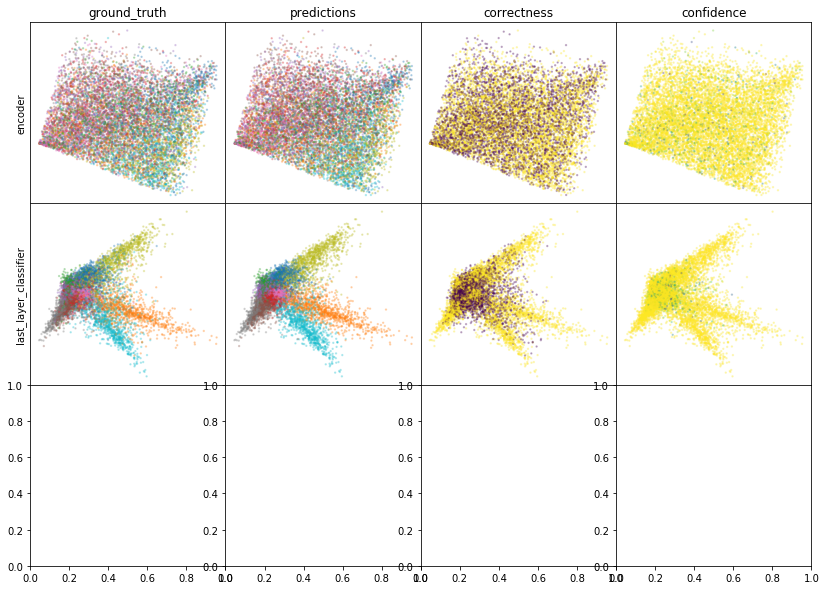

W0809 11:02:36.755707 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 11:02:36.840222 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 11:02:36.919361 139799398029120 legend.py:1282] No handles with labels found to put in legend.


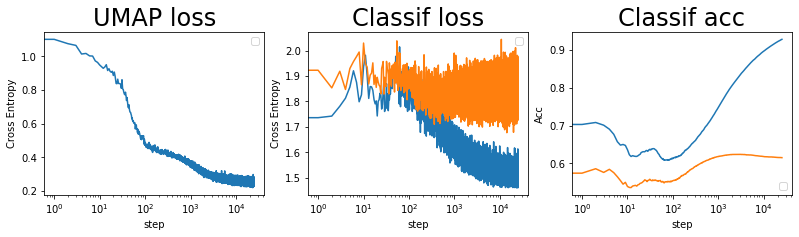

batch: 25000 | train acc: 0.9284 | val acc: 0.6153


KeyboardInterrupt: 

In [51]:
improved_this_epoch = True

for edge_epoch, epoch in tqdm(
    zip(edge_iter, np.arange(N_EPOCHS)), total=N_EPOCHS, desc="epoch"
):


    pbar = tqdm(total=BATCHES_PER_EPOCH, leave=False, desc="loss")

    for (batch_to, batch_from), (X, y), (X_val, y_val) in zip(
        edge_epoch, labeled_iter, data_valid
    ):
        
        # train
        (
            attraction_loss,
            repellant_loss,
            umap_loss,
            classifier_loss,
            classifier_acc,
        ) = model.train(batch_to=X_train[np.array(batch_to)], batch_from=X_train[np.array(batch_from)], X=X, y=y, umap_prop = umap_prop)
        
        
        # compute validation loss
        val_loss, val_acc = compute_classifier_loss(
            X_val,
            y_val,
            model.encoder,
            model.classifier,
            model.sparse_ce,
            model.class_acc_val,
        )
        
        pbar.update()
        pbar.set_description("val acc: {}".format(str(round(val_acc.numpy(), 5))))

        # save losses
        model.write_losses(
            tf.convert_to_tensor(batch, dtype=tf.int64),
            classifier_acc,
            classifier_loss,
            umap_loss,
            val_loss,
            val_acc,
        )

        # plot results
        if batch % plot_frequency == 0:
            plot_umap_classif_results(
                model,
                X_valid,
                Y_valid,
                X_train,
                X_labeled,
                Y_labeled,
                batch_size,
                cmap="tab10",
                cmap2="tab10",
            )
            print(
                "batch: {} | train acc: {} | val acc: {}".format(
                    str(batch),
                    str(round(classifier_acc.numpy(), 4)),
                    str(round(val_acc.numpy(), 4)),
                )
            )

        # make any improvement isn't a fluke of small batch size
        if batches_since_last_reload >= reload_tolerance:

            # save if validation accuracy went up
            if val_acc > best_saved_acc + max_save_delta:
                # save weights
                print(
                    "saving weights | batch = {} | acc = {}".format(
                        batch, round(val_acc.numpy() * 100, 3)
                    )
                )
                model.encoder.save_weights((cpt_path / "encoder").as_posix())
                model.classifier.save_weights((cpt_path / "classifier").as_posix())
                best_saved_acc = val_acc.numpy()
                # save batch number
                best_saved_batch = copy.deepcopy(batch)

            # reinitialize if validation accuracy went down
            if val_acc < (best_saved_acc - max_reinitialize_delta):
                # if
                if batches_since_last_reload >= reload_tolerance:
                    batches_since_last_reload = 0
                    lr = model.optimizer.lr.numpy()
                    print(
                        "batch {} | acc = {} | learn rate = {} | reloading weights from batch {} at acc {} | n reloads = {}".format(
                            batch,
                            str(round(val_acc.numpy(), 3)),
                            lr,
                            best_saved_batch,
                            int(best_saved_acc * 100),
                            n_reloads,
                        )
                    )
                    # reload weights
                    model.encoder.load_weights((cpt_path / "encoder").as_posix())
                    model.classifier.load_weights((cpt_path / "classifier").as_posix())

                    # set new learning rate
                    model.optimizer.lr.assign(lr / 2)

                    batch += 1
                    n_reloads += 1

                    # stop if reloaded too many times
                    if n_reloads >= max_reloads:
                        break

            # if there is an imporovement, set new best score
            if val_acc > best_acc + min_delta:
                improved_this_epoch = True
                last_improvement = 0
                best_acc = val_acc
            # if the model has not improved in patience batches, end epoch
            elif last_improvement >= patience:
                last_improvement = 0
                print(
                    "leaving epoch because no improvement in {} batches".format(
                        patience
                    )
                )
                break
            else:
                last_improvement += 1

        # up the ticker
        batch += 1
        batches_since_last_reload += 1
    pbar.close()

In [52]:
test_enc = model_data(X_test, batch_size, model.encoder)

In [53]:
y_pred = model_data(test_enc, batch_size, model.classifier)

In [54]:
test_acc = tf.keras.metrics.sparse_categorical_accuracy(
    Y_test, y_pred
).numpy()
print(np.mean(test_acc))

0.6169


In [55]:
np.save(cpt_path / 'test_acc.npy', test_acc)

In [56]:
batch_to

<tf.Tensor: shape=(128,), dtype=int32, numpy=
array([ 8443, 12697, 18309, 10809, 11455,  1487, 26673, 23870, 33949,
       36748, 34981, 38330,   183,  2333, 19191,   195, 27117,    62,
       38713, 16885, 15683, 16538, 32629,  7986,  1314,  1150, 23858,
       20751,  3989, 30551,  7275, 12619,  4648, 34799, 32574,  8246,
       17852, 17310, 12409,     3, 30915, 25062,  7222, 22777, 32102,
       23475, 31193, 31391, 20062,  3376, 21942,  6852, 12615, 38831,
       10557, 29265, 32534,  3890, 39915,  1139,  2767, 15213, 21707,
        3627,  6011,  7366, 16186, 10686, 13955,  6726, 21120, 19838,
        4805, 23118,  9849,  3656, 19871, 36105,  5417,  5145, 23307,
       12317, 15226,  7207, 31883, 18776, 28176, 27116, 34233,  6545,
       22172, 27926, 12457, 34210, 24186,  2022, 24929, 36355, 38437,
        4644, 38255, 13119,  7003, 36983, 24536, 35734, 27696, 39649,
        9323, 26937, 17353, 25113, 31236, 22411, 25931,   673, 29616,
       20409, 29907,  8115, 36144, 31993, 32

In [58]:
z_enc = model_data(X_valid, 100, encoder)
last_layer_class = model_data(z_enc, batch_size, pred_model)
z_pred = model_data(z_enc, batch_size, classifier)
confidence = np.max(z_pred, axis = 1)

valid_acc = tf.keras.metrics.sparse_categorical_accuracy(
    Y_valid, z_pred
).numpy()
print(np.mean(valid_acc))

0.6111


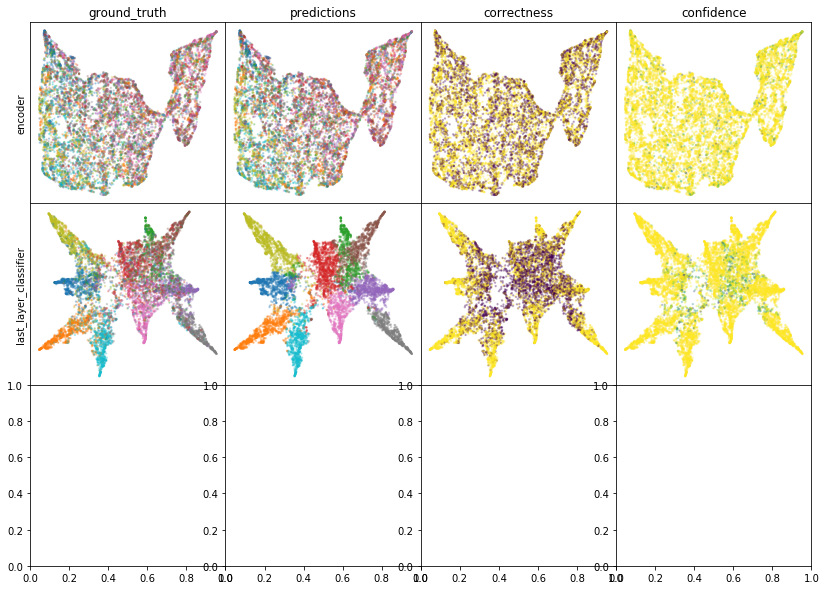

W0809 11:04:09.325210 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 11:04:09.408074 139799398029120 legend.py:1282] No handles with labels found to put in legend.
W0809 11:04:09.492428 139799398029120 legend.py:1282] No handles with labels found to put in legend.


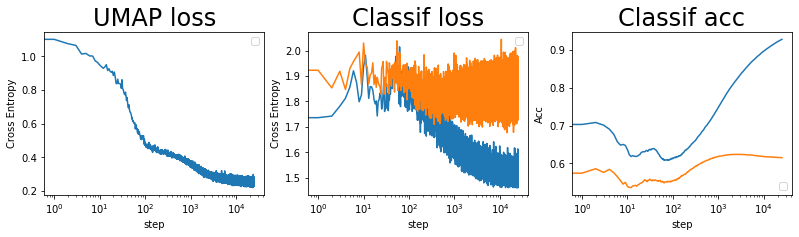

In [59]:
plot_umap_classif_results(model, X_valid, Y_valid, X_train, X_labeled, Y_labeled, batch_size, dralg=UMAP, cmap='tab10', cmap2='tab10')

In [60]:
z_enc = model_data(X_train, 100, encoder)
last_layer_class = model_data(z_enc, batch_size, pred_model)
z_pred = model_data(z_enc, batch_size, classifier)
confidence = np.max(z_pred, axis = 1)
umap_class = UMAP(verbose=True).fit_transform(last_layer_class, Y_masked)
classifications = np.argmax(z_pred, axis=1)
correctness = classifications == Y_train
np.save(cpt_path / 'train_last_layer_class.npy', last_layer_class)
np.save(cpt_path / 'train_z_enc.npy', z_enc)
np.save(cpt_path / 'train_last_layer_class_umap.npy', umap_class)

UMAP(dens_frac=0.0, dens_lambda=0.0, verbose=True)
Construct fuzzy simplicial set
Sun Aug  9 11:04:15 2020 Finding Nearest Neighbors
Sun Aug  9 11:04:15 2020 Building RP forest with 15 trees
Sun Aug  9 11:04:16 2020 parallel NN descent for 15 iterations
	 0  /  15
	 1  /  15
	 2  /  15
	 3  /  15
Sun Aug  9 11:04:17 2020 Finished Nearest Neighbor Search
Sun Aug  9 11:04:17 2020 Construct embedding
	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Sun Aug  9 11:04:51 2020 Finished embedding


Text(0.5, 1.0, 'Correct')

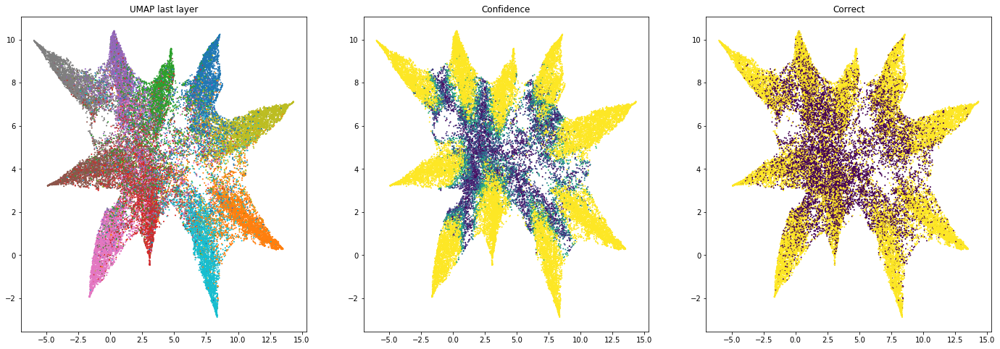

In [61]:
fig, axs = plt.subplots(ncols = 3, figsize=(24,8))
axs[0].scatter(umap_class[:,0], umap_class[:,1], s=1, c = Y_train, cmap = plt.cm.tab10)
axs[0].set_title('UMAP last layer')
axs[1].scatter(umap_class[:,0], umap_class[:,1], s=1, c = np.log(1-confidence + 1e-10), cmap = plt.cm.viridis_r)
axs[1].set_title('Confidence')
axs[2].scatter(umap_class[:,0], umap_class[:,1], s=1, c = correctness, cmap = plt.cm.viridis)
axs[2].set_title('Correct')

UMAP(dens_frac=0.0, dens_lambda=0.0, verbose=True)
Construct fuzzy simplicial set
Sun Aug  9 11:04:54 2020 Finding Nearest Neighbors
Sun Aug  9 11:04:54 2020 Building RP forest with 15 trees
Sun Aug  9 11:04:55 2020 parallel NN descent for 15 iterations
	 0  /  15
	 1  /  15
	 2  /  15
Sun Aug  9 11:04:56 2020 Finished Nearest Neighbor Search
Sun Aug  9 11:04:56 2020 Construct embedding
	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Sun Aug  9 11:05:31 2020 Finished embedding


(-5.728437610709396,
 14.659452148520673,
 -3.8435629507154414,
 11.634421934708971)

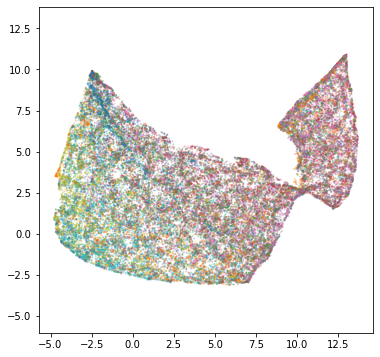

In [62]:
umap_latent = UMAP(verbose=True).fit_transform(z_enc, Y_masked)
fig, ax = plt.subplots(figsize=(6, 6))
ax.scatter(
    umap_latent[:, 0], umap_latent[:, 1], s=1, c=Y_train, cmap=plt.cm.tab10, alpha=0.25
)
ax.axis("equal")